**Non-monetary benefits**

Career Development Opportunities:  
Keywords: "training program," "tuition reimbursement," "mentorship," "career growth," "professional development"

Work-Life Balance Initiatives:  
Keywords: "paid time off," "PTO," "extra vacation," "wellness program," "mental health day"

Health and Well-being Perks:  
Keywords: "wellness stipend," "health benefits," "mental health support," "gym membership," "wellness program"

Employee Recognition Programs:  
Keywords: "employee of the month," "long-term rewards," "recognition program," "peer recognition," "service awards"

Parental or Family Support:  
Keywords: "parental leave," "childcare assistance," "family support," "flexible maternity leave," "paternity leave"

Work Environment and Company Culture:  
Keywords: "collaborative environment," "diversity and inclusion," "team culture," "creative freedom," "values-driven"

In [3]:
import pandas as pd
import re
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
benefits = ['CAREER_DEV', 'WLB', 'WELLBEING', 'RECOGNITION', 'FAMILY', 'CULTURE']

In [215]:
# set font size
plt.rcParams.update({'font.size': 14})

In [3]:
import swifter

/Users/alejandracastaneda/anaconda3/envs/thesisenv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
from logit_model import *

In [7]:
# path = '/Users/alejandracastaneda/Documents/Thesis/Data/us-003.csv'

In [6]:
# path2 = '/Users/alejandracastaneda/Documents/Thesis/Data/OII_US_10M_POSTS_V2.csv'

In [9]:
# data_v2 = pd.read_csv(path2)

In [63]:
# # delete data_v2
# del data_v2

In [11]:
# len(data_v2)

11729662

In [12]:
data_v2.head()

,ID,CITY_NAME,COUNTY_NAME,STATE_NAME,NAICS_2022_2,NAICS_2022_2_NAME,MIN_EDULEVELS_NAME,EMPLOYMENT_TYPE,EMPLOYMENT_TYPE_NAME,IS_INTERNSHIP,...,ONET,ONET_NAME,ONET_2019,ONET_2019_NAME,SOC_2021_2_NAME,SOC_2021_2,MIN_YEARS_EXPERIENCE,COMPANY,COMPANY_NAME,COMPANY_RAW
0,b5e9360ab429758bc6e8e259fcf66234d3163dcf,"Brentwood, TN","Williamson, TN",Tennessee,62,Health Care and Social Assistance,Master's degree,1,Full-time (> 32 hours),False,...,29-1051.00,Pharmacists,29-1051.00,Pharmacists,Healthcare Practitioners and Technical Occupat...,29-0000,8.0,47183298,Premise Health,Premise Health
1,eff8c5c87b50735a4684ebc33d41d1b36ff46aa8,"Smyrna, TN","Rutherford, TN",Tennessee,72,Accommodation and Food Services,High school or GED,1,Full-time (> 32 hours),False,...,37-2011.00,"Janitors and Cleaners, Except Maids and Housek...",37-2011.00,"Janitors and Cleaners, Except Maids and Housek...",Building and Grounds Cleaning and Maintenance ...,37-0000,NaN,40582235,Carrols Corporation,Carrols Corporation
2,b8b974adf881aa6c934392d71ad46dff810dcb34,"Denver, CO","Denver, CO",Colorado,52,Finance and Insurance,Bachelor's degree,1,Full-time (> 32 hours),False,...,15-1252.00,Software Developers,15-1252.00,Software Developers,Computer and Mathematical Occupations,15-0000,5.0,4808322,Bank of America,Bank of America
3,65a1fb796d6e098151727adeb2ace5e810361b87,"Chicago, IL","Cook, IL",Illinois,71,"Arts, Entertainment, and Recreation",Bachelor's degree,1,Full-time (> 32 hours),False,...,15-2051.01,Business Intelligence Analysts,15-2051.01,Business Intelligence Analysts,Computer and Mathematical Occupations,15-0000,2.0,24818297,Cwt,CWT
4,1513ec98d6d7b3ffda588c9834a9ac2e47f8921b,"Plano, TX","Collin, TX",Texas,31,Manufacturing,Bachelor's degree,1,Full-time (> 32 hours),False,...,13-2011.00,Accountants and Auditors,13-2011.00,Accountants and Auditors,Business and Financial Operations Occupations,13-0000,3.0,39511702,Keurig Dr Pepper,Keurig Dr Pepper


In [ ]:
# th_data = pd.read_parquet('/Users/alejandracastaneda/Documents/Thesis/Data/th_data.parquet')

In [14]:
# get sample of 5 million rows
sample5 = data_v2.sample(n=5000000, random_state=1)

In [65]:
del sample5

In [ ]:
# Classify Jobs With AI Skills
with open('../data/ai_skill_ids.pkl', 'rb') as f:
    ai_skill_ids = pickle.load(f)
ai_skill_ids
# Function to check if any AI skill ID is in the job's skills
def Has AI Skills(skill_list, ai_skill_ids):
    skill_list = eval(skill_list)  # Convert string representation of list to actual list
    return any(skill_id in skill_list for skill_id in ai_skill_ids)
usdf['Has AI Skills'] = usdf.swifter.progress_bar(True).apply(lambda x: Has AI Skills(x['SKILLS'], ai_skill_ids), axis=1)
usdf.to_csv(export_path)

# Test with OG Data

In [13]:
path = '../../Data/us-003_w_flexibility_ai_skills.csv'

In [14]:
og_ai = pd.read_csv(path)

/var/folders/5k/j3bfrd8s2_l092hd5snmdbzm0000gn/T/ipykernel_32204/2671361279.py:1: DtypeWarning: Columns (62) have mixed types. Specify dtype option on import or set low_memory=False.
  og_ai = pd.read_csv(path)


In [21]:
print(og_ai.columns)

Index(['ID', 'CITY', 'CITY_NAME', 'COMPANY', 'COMPANY_NAME', 'COMPANY_RAW',
       'COMPANY_IS_STAFFING', 'DUPLICATES', 'EDUCATION_LEVELS',
       'EDUCATION_LEVELS_NAME',
       ...
       'NAICS_2022_4', 'NAICS_2022_4_NAME', 'NAICS_2022_5',
       'NAICS_2022_5_NAME', 'NAICS_2022_6', 'NAICS_2022_6_NAME',
       'MODELED_EXPIRED', 'MODELED_DURATION', 'FLEXIBILITY', 'HAS_AI_SKILLS'],
      dtype='object', length=134)


In [20]:
og_ai.groupby('IS_INTERNSHIP').count()

,ID,CITY,CITY_NAME,COMPANY,COMPANY_NAME,COMPANY_RAW,COMPANY_IS_STAFFING,DUPLICATES,EDUCATION_LEVELS,EDUCATION_LEVELS_NAME,...,NAICS_2022_4,NAICS_2022_4_NAME,NAICS_2022_5,NAICS_2022_5_NAME,NAICS_2022_6,NAICS_2022_6_NAME,MODELED_EXPIRED,MODELED_DURATION,FLEXIBILITY,HAS_AI_SKILLS
IS_INTERNSHIP,,,,,,,,,,,,,,,,,,,,,
False,918004,918004,918004,918004,918004,912830,918004,918004,918004,918004,...,918004,918004,918004,918004,918004,918004,902738,855219,918004,918004
True,11847,11847,11847,11847,11847,11819,11847,11847,11847,11847,...,11847,11847,11847,11847,11847,11847,11636,7076,11847,11847


In [15]:
og_ai['POSTED'] = pd.to_datetime(og_ai['POSTED'])
og_ai['YEAR'] = og_ai['POSTED'].dt.year

In [10]:
og_ai.groupby('YEAR').count()

NameError: name 'og_ai' is not defined

In [16]:
og_ai_noint = og_ai[og_ai['IS_INTERNSHIP'] == False]

In [114]:
og_ai_noint.groupby('HAS_AI_SKILLS').count()

,ID,CITY,CITY_NAME,COMPANY,COMPANY_NAME,COMPANY_RAW,COMPANY_IS_STAFFING,DUPLICATES,EDUCATION_LEVELS,EDUCATION_LEVELS_NAME,...,NAICS_2022_4,NAICS_2022_4_NAME,NAICS_2022_5,NAICS_2022_5_NAME,NAICS_2022_6,NAICS_2022_6_NAME,MODELED_EXPIRED,MODELED_DURATION,FLEXIBILITY,YEAR
HAS_AI_SKILLS,,,,,,,,,,,,,,,,,,,,,
False,906671,906671,906671,906671,906671,901544,906671,906671,906671,906671,...,906671,906671,906671,906671,906671,906671,891571,844607,906671,906671
True,11333,11333,11333,11333,11333,11286,11333,11333,11333,11333,...,11333,11333,11333,11333,11333,11333,11167,10612,11333,11333


In [17]:
og_ai = og_ai_noint

In [20]:
og_ai.to_parquet('data/us-003_noint.parquet')

In [27]:
og_ai.groupby('HAS_AI_SKILLS').count()

,ID,CITY,CITY_NAME,COMPANY,COMPANY_NAME,COMPANY_RAW,COMPANY_IS_STAFFING,DUPLICATES,EDUCATION_LEVELS,EDUCATION_LEVELS_NAME,...,NAICS_2022_4,NAICS_2022_4_NAME,NAICS_2022_5,NAICS_2022_5_NAME,NAICS_2022_6,NAICS_2022_6_NAME,MODELED_EXPIRED,MODELED_DURATION,FLEXIBILITY,YEAR
HAS_AI_SKILLS,,,,,,,,,,,,,,,,,,,,,
False,918049,918049,918049,918049,918049,912894,918049,918049,918049,918049,...,918049,918049,918049,918049,918049,918049,902746,851425,918049,918049
True,11802,11802,11802,11802,11802,11755,11802,11802,11802,11802,...,11802,11802,11802,11802,11802,11802,11628,10870,11802,11802


In [21]:
og_no_ai = og_ai[og_ai['HAS_AI_SKILLS'] == 0]

In [22]:
og_ai_sample = og_ai[og_ai['HAS_AI_SKILLS'] == 1].sample(n=10000, random_state=1)
og_no_ai_sample = og_no_ai.sample(n=10000, random_state=1)

In [23]:
even_sample = pd.concat([og_ai_sample, og_no_ai_sample])

In [24]:
even_sample.to_csv('data/even_sample.csv')

# Load Data

In [5]:
even_sample = pd.read_csv('data/even_sample.csv')

# Search for Benefits

**Non-monetary benefits**

Career Development Opportunities:  
Keywords: "training program," "tuition reimbursement," "mentorship," "career growth," "professional development"

Work-Life Balance Initiatives:  
Keywords: "paid time off," "PTO," "extra vacation," "wellness program," "mental health day"

Health and Well-being Perks:  
Keywords: "wellness stipend," "health benefits," "mental health support," "gym membership," "wellness program"

Employee Recognition Programs:  
Keywords: "employee of the month," "long-term rewards," "recognition program," "peer recognition," "service awards"

Parental or Family Support:  
Keywords: "parental leave," "childcare assistance," "family support," "flexible maternity leave," "paternity leave"

Work Environment and Company Culture:  
Keywords: "collaborative environment," "diversity and inclusion," "team culture," "creative freedom," "values-driven"

In [39]:
career_dev = "training programs", "education assistance","tuition reimbursement", "tuition assistance", "mentorship", "career growth", "professional development", "leadership development", "career advancement", "leadership training", "growth opportunities", "personal development", "education reimbursement"

In [73]:
wlb = "paid time off", "PTO", "extra vacation", "flexible vacation", "mental health day", "work-life balance", , "work/life balance","generous time-off", "generous time off", "paid vacation", "paid holidays", "holiday pay"

In [64]:
wellbeing = "wellness stipend", "health benefits", "mental health support", "gym membership", "wellness program", "well-being stipend", "wellness programs", "mental health benefits", "employee well-being", "health care benefits"

In [86]:
recognition = "employee of the month", "long-term rewards", "recognition program", "peer recognition", "service awards", "employee recognition"

In [79]:
family = "parental leave", "childcare assistance", "childcare support", "childcare", "family support", "flexible maternity leave", "paternity leave", "maternity leave", "paid family leave", "child care discount"

In [44]:
culture = "collaborative environment", "diversity and inclusion", "team culture", "creative freedom", "values-driven", "inclusive culture", "diverse team", "inclusive environment"

In [89]:
keywords_list = [career_dev,wlb,wellbeing, recognition, family, culture]

## Career Development

In [46]:
def check_benefits(df, keywords, benefit):
    pattern = r'\b(' + '|'.join(map(re.escape, keywords)) + r')\b'
    df[benefit] = df['BODY'].str.contains(pattern, case=False, regex=True)
    return df
    

In [27]:
def plot_counts(df, benefit):
    counts = df.groupby(['HAS_AI_SKILLS',benefit]).size().reset_index()
    plt.figure(figsize=(10, 6))
    ax = sns.barplot(x='HAS_AI_SKILLS', y=0, hue=benefit, data=counts)
    # rename x axis labels
    labels = ['Non-AI Role', 'AI Role']
    ax.set_xticklabels(labels)
    ax.set_xlabel(None)
    ax.set_ylabel('Jobs')

In [47]:
check_benefits(even_sample, career_dev, 'CAREER_DEV')

/var/folders/5k/j3bfrd8s2_l092hd5snmdbzm0000gn/T/ipykernel_52608/2902580251.py:3: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  df[benefit] = df['BODY'].str.contains(pattern, case=False, regex=True)


,Unnamed: 0,ID,CITY,CITY_NAME,COMPANY,COMPANY_NAME,COMPANY_RAW,COMPANY_IS_STAFFING,DUPLICATES,EDUCATION_LEVELS,...,MODELED_DURATION,FLEXIBILITY,HAS_AI_SKILLS,YEAR,CAREER_DEV,WLB,WELLBEING,RECOGNITION,FAMILY,CULTURE
0,794369,3f5e255af22d37ff77071a55351bd6c50283db65,Q2hpY2FnbywgSUw=,"Chicago, IL",43173610,Synchrony Bank,Synchrony Bank,False,0,[\n 2\n],...,37.0,False,True,2018,False,False,False,False,False,False
1,843192,610f91b1b99e79c630995df513108067a8f3c221,SmVyc2V5IENpdHksIE5K,"Jersey City, NJ",33553916,JPMorgan Chase,JPMorgan Chase Bank,False,0,[\n 4\n],...,34.0,False,True,2022,False,False,False,False,False,True
2,160635,85476d1c955592e4b5531a62c7b67ba92d52c4a5,RG9iYnMgRmVycnksIE5Z,"Dobbs Ferry, NY",36141914,Gwynedd Mercy University,Mercy University,False,3,"[\n 2,\n 3\n]",...,55.0,False,True,2023,False,False,False,False,False,False
3,347435,c509bbc7dbb3e7f3086abe243b5e9b5dcebf9521,V2FzaGluZ3RvbiwgREM=,"Washington, DC",38121853,Elevance Health,Anthem,False,0,"[\n 1,\n 2\n]",...,18.0,False,True,2022,False,True,True,False,False,True
4,693162,cc7c822628cc5d8dd345c8b356f5cbc01f5472d6,TW9udHBlbGllciwgVlQ=,"Montpelier, VT",2219962,American Express,American Express in Montpelier,False,0,[\n 99\n],...,32.0,False,True,2022,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,499492,89c21b4c7787da75c951052ff6e1b4c3bde46e6b,RnJlc25vLCBDQQ==,"Fresno, CA",83750164,Aerotek,Aerotek,True,1,[\n 99\n],...,29.0,False,False,2020,False,False,False,False,False,False
19996,773600,96705c16e2bb96ac7d60f22212c5b86d0eafe827,Tm9yd29vZCwgTUE=,"Norwood, MA",99459859,Moderna Therapeutics,Moderna,False,2,[\n 2\n],...,20.0,False,False,2021,False,False,False,False,False,False
19997,346402,e65eee74e6fdad25ef5683790bf4580750484abb,UmVkIEJhbmssIE5K,"Red Bank, NJ",36938321,Monmouth Day Care Center,MONMOUTH DAY CARE CENTER,False,0,[\n 0\n],...,41.0,False,False,2023,True,True,False,False,False,False
19998,671858,11112143f65e555a0f92b086b6982e891c9ae021,W1Vua25vd24gQ2l0eV0sIEtT,"[Unknown City], KS",11257336,Marriott International,Marriott,False,0,"[\n 0,\n 1\n]",...,36.0,False,False,2023,False,True,False,False,True,False


In [124]:
career_dev_count = even_sample.groupby(['HAS_AI_SKILLS','CAREER_DEV']).size().reset_index()

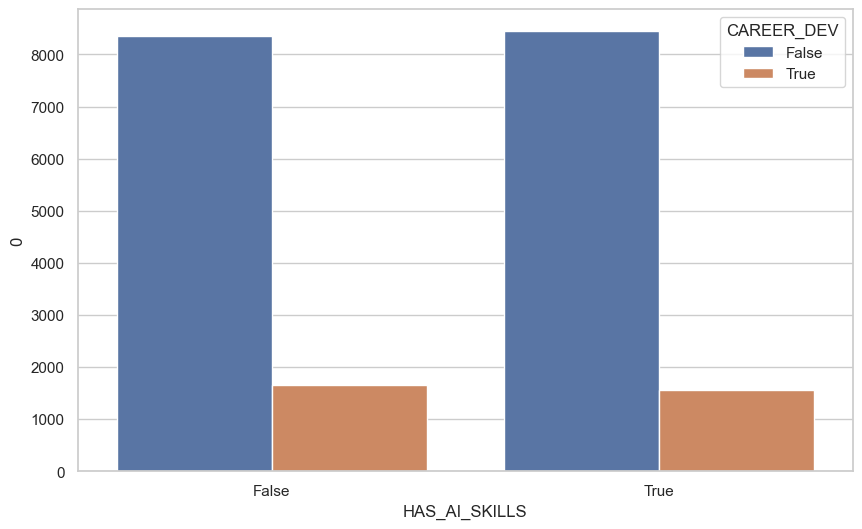

In [82]:
# plot career_dev_count
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid")
plt.figure(figsize=(10, 6))
ax = sns.barplot(x='HAS_AI_SKILLS', y=0, hue='CAREER_DEV', data=career_dev_count)



## Work-Life Balance

In [74]:
even_sample = check_benefits(even_sample, wlb, 'WLB')

/var/folders/5k/j3bfrd8s2_l092hd5snmdbzm0000gn/T/ipykernel_52608/2902580251.py:3: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  df[benefit] = df['BODY'].str.contains(pattern, case=False, regex=True)


/var/folders/5k/j3bfrd8s2_l092hd5snmdbzm0000gn/T/ipykernel_29234/1579921570.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels)


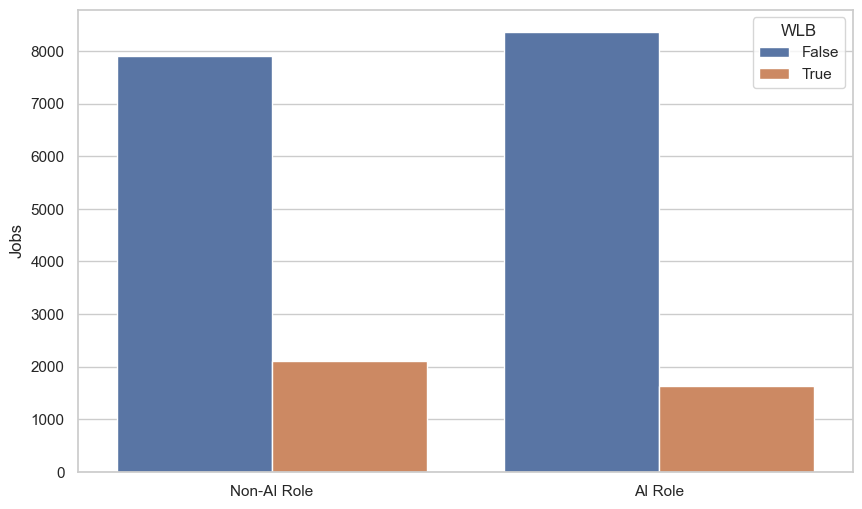

In [62]:
plot_counts(even_sample, 'WLB')

## Well-Being

In [66]:
check_benefits(even_sample, wellbeing, 'WELLBEING')

/var/folders/5k/j3bfrd8s2_l092hd5snmdbzm0000gn/T/ipykernel_52608/2902580251.py:3: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  df[benefit] = df['BODY'].str.contains(pattern, case=False, regex=True)


,Unnamed: 0,ID,CITY,CITY_NAME,COMPANY,COMPANY_NAME,COMPANY_RAW,COMPANY_IS_STAFFING,DUPLICATES,EDUCATION_LEVELS,...,MODELED_DURATION,FLEXIBILITY,HAS_AI_SKILLS,YEAR,CAREER_DEV,WLB,WELLBEING,RECOGNITION,FAMILY,CULTURE
0,794369,3f5e255af22d37ff77071a55351bd6c50283db65,Q2hpY2FnbywgSUw=,"Chicago, IL",43173610,Synchrony Bank,Synchrony Bank,False,0,[\n 2\n],...,37.0,False,True,2018,False,False,False,False,False,False
1,843192,610f91b1b99e79c630995df513108067a8f3c221,SmVyc2V5IENpdHksIE5K,"Jersey City, NJ",33553916,JPMorgan Chase,JPMorgan Chase Bank,False,0,[\n 4\n],...,34.0,False,True,2022,False,False,False,False,False,True
2,160635,85476d1c955592e4b5531a62c7b67ba92d52c4a5,RG9iYnMgRmVycnksIE5Z,"Dobbs Ferry, NY",36141914,Gwynedd Mercy University,Mercy University,False,3,"[\n 2,\n 3\n]",...,55.0,False,True,2023,False,False,False,False,False,False
3,347435,c509bbc7dbb3e7f3086abe243b5e9b5dcebf9521,V2FzaGluZ3RvbiwgREM=,"Washington, DC",38121853,Elevance Health,Anthem,False,0,"[\n 1,\n 2\n]",...,18.0,False,True,2022,False,True,True,False,False,True
4,693162,cc7c822628cc5d8dd345c8b356f5cbc01f5472d6,TW9udHBlbGllciwgVlQ=,"Montpelier, VT",2219962,American Express,American Express in Montpelier,False,0,[\n 99\n],...,32.0,False,True,2022,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,499492,89c21b4c7787da75c951052ff6e1b4c3bde46e6b,RnJlc25vLCBDQQ==,"Fresno, CA",83750164,Aerotek,Aerotek,True,1,[\n 99\n],...,29.0,False,False,2020,False,False,False,False,False,False
19996,773600,96705c16e2bb96ac7d60f22212c5b86d0eafe827,Tm9yd29vZCwgTUE=,"Norwood, MA",99459859,Moderna Therapeutics,Moderna,False,2,[\n 2\n],...,20.0,False,False,2021,False,False,False,False,False,False
19997,346402,e65eee74e6fdad25ef5683790bf4580750484abb,UmVkIEJhbmssIE5K,"Red Bank, NJ",36938321,Monmouth Day Care Center,MONMOUTH DAY CARE CENTER,False,0,[\n 0\n],...,41.0,False,False,2023,True,True,False,False,True,False
19998,671858,11112143f65e555a0f92b086b6982e891c9ae021,W1Vua25vd24gQ2l0eV0sIEtT,"[Unknown City], KS",11257336,Marriott International,Marriott,False,0,"[\n 0,\n 1\n]",...,36.0,False,False,2023,False,True,False,False,True,False


In [ ]:
even_sample

,ID,CITY,CITY_NAME,COMPANY,COMPANY_NAME,COMPANY_RAW,COMPANY_IS_STAFFING,DUPLICATES,EDUCATION_LEVELS,EDUCATION_LEVELS_NAME,...,NAICS_2022_6,NAICS_2022_6_NAME,MODELED_EXPIRED,MODELED_DURATION,FLEXIBILITY,HAS_AI_SKILLS,YEAR,CAREER_DEV,WLB,WELLBEING
196958,c69f509cba1d512a619f1d982b0780265101351a,TWlubmVhcG9saXMsIE1O,"Minneapolis, MN",35119932,Coloplast,Coloplast,False,1,[\n 2\n],"[\n ""Bachelor's degree""\n]",...,339112,Surgical and Medical Instrument Manufacturing,2019-01-10,8.0,False,True,2019,False,False,False
550713,fc24e4b48e77f5fa931a120871ec0ab56aade721,U2FuIE1hdGVvLCBDQQ==,"San Mateo, CA",113027,ZoomInfo Technologies,"Zoom Information, Inc.",False,1,"[\n 2,\n 3\n]","[\n ""Bachelor's degree"",\n ""Master's degree""\n]",...,518210,"Computing Infrastructure Providers, Data Proce...",2022-01-28,26.0,False,True,2022,False,False,False
237851,48e44ca56597c2bd0f98304180f3f34dfff67e8b,Q2hpY2FnbywgSUw=,"Chicago, IL",0,Unclassified,Unknown,False,0,"[\n 2,\n 3,\n 4\n]","[\n ""Bachelor's degree"",\n ""Master's degree""...",...,999999,Unclassified Industry,2022-10-04,15.0,False,True,2022,False,False,False
681127,b0932369b429da89f5d85f7627eec2fb48046631,V2ljaGl0YSwgS1M=,"Wichita, KS",9568684,NetApp,NetApp in Wichita,False,1,[\n 2\n],"[\n ""Bachelor's degree""\n]",...,334112,Computer Storage Device Manufacturing,2022-07-26,44.0,False,True,2022,False,False,False
718929,ad8dd8f0e238d9c892045b4200878f7816785e1c,U2FuIEZyYW5jaXNjbywgQ0E=,"San Francisco, CA",8592955,Accenture,Accenture,False,4,[\n 99\n],"[\n ""No Education Listed""\n]",...,541512,Computer Systems Design Services,2018-08-25,44.0,False,True,2018,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
379437,5d1348f0ec11fe690f50b9e40ca7e1a9b0bb7300,U3ByaW5nZmllbGQsIE9S,"Springfield, OR",39017361,PacificSource Health Plans,PacificSource,False,1,[\n 99\n],"[\n ""No Education Listed""\n]",...,524210,Insurance Agencies and Brokerages,2022-02-26,23.0,True,False,2022,False,False,False
389180,68be5cd464ce34b7a0f1d01f6d76e3704df12f65,Q2xldmVsYW5kLCBPSA==,"Cleveland, OH",3201083,Sodexo,Sodexo Inc.,False,0,[\n 0\n],"[\n ""High school or GED""\n]",...,722310,Food Service Contractors,2019-08-30,NaN,False,False,2019,True,False,False
852135,af44d935870dea1b28c35cac4f73ae93ffb3f424,TWFydGluc3ZpbGxlLCBWQQ==,"Martinsville, VA",37662275,Lowe's,Lowe's,False,4,[\n 99\n],"[\n ""No Education Listed""\n]",...,444110,Home Centers,2019-09-14,2.0,False,False,2019,False,False,False
879410,4713ea3e62482c4a65839bc16b66affe04d9debd,RGVzIE1vaW5lcywgSUE=,"Des Moines, IA",3889473,Dotdash Meredith,MEREDITH CORPORATION,False,0,[\n 99\n],"[\n ""No Education Listed""\n]",...,513120,Periodical Publishers,2021-07-23,56.0,False,False,2021,False,False,False


/var/folders/5k/j3bfrd8s2_l092hd5snmdbzm0000gn/T/ipykernel_29234/1579921570.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels)


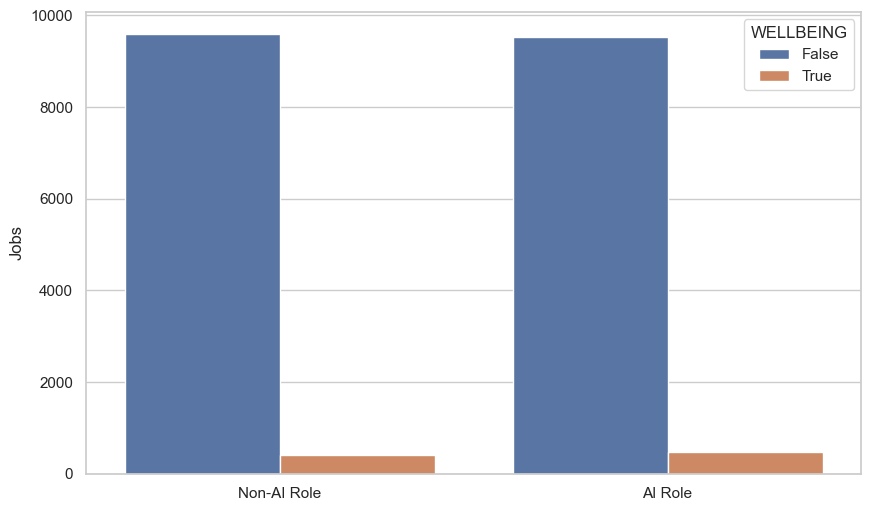

In [71]:
plot_counts(even_sample, 'WELLBEING')

In [76]:
for i in even_sample[even_sample['WELLBEING']==True]['BODY']:
    print(i)
    print('\n')
    print('-'*100)

Job Information

Anthem, Inc. AI Principal AI Engineer in Reston, Virginia

Description

SHIFT: Day Job

SCHEDULE: Full-time

Your Talent. Our Vision. At Anthem, Inc., its a powerful combination, and the foundation upon which were creating greater access to care for our members, greater value for our customers, and greater health for our communities. Join us and together we will drive the future of health care.

This is an exceptional opportunity to do innovative work that means more to you and those we serve at one of America's leading health care companies and a Fortune Top 50 Company.

AI Principal AI Engineer is r esponsible for applying and integrating statistical, mathematical, predictive modeling and business analysis for the Artificial Intelligence (AI) function. Primary duties may include but are not limited to:

*

Implement rigorous best-practice methodologies for pre-defined use cases to identify optimal intervention strategies based on causal estimates

*

Identify and val

## Employee Recognition Programs

In [87]:
check_benefits(even_sample, recognition, 'RECOGNITION')

/var/folders/5k/j3bfrd8s2_l092hd5snmdbzm0000gn/T/ipykernel_52608/2902580251.py:3: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  df[benefit] = df['BODY'].str.contains(pattern, case=False, regex=True)


,Unnamed: 0,ID,CITY,CITY_NAME,COMPANY,COMPANY_NAME,COMPANY_RAW,COMPANY_IS_STAFFING,DUPLICATES,EDUCATION_LEVELS,...,MODELED_DURATION,FLEXIBILITY,HAS_AI_SKILLS,YEAR,CAREER_DEV,WLB,WELLBEING,RECOGNITION,FAMILY,CULTURE
0,794369,3f5e255af22d37ff77071a55351bd6c50283db65,Q2hpY2FnbywgSUw=,"Chicago, IL",43173610,Synchrony Bank,Synchrony Bank,False,0,[\n 2\n],...,37.0,False,True,2018,False,False,False,False,False,False
1,843192,610f91b1b99e79c630995df513108067a8f3c221,SmVyc2V5IENpdHksIE5K,"Jersey City, NJ",33553916,JPMorgan Chase,JPMorgan Chase Bank,False,0,[\n 4\n],...,34.0,False,True,2022,False,False,False,False,False,True
2,160635,85476d1c955592e4b5531a62c7b67ba92d52c4a5,RG9iYnMgRmVycnksIE5Z,"Dobbs Ferry, NY",36141914,Gwynedd Mercy University,Mercy University,False,3,"[\n 2,\n 3\n]",...,55.0,False,True,2023,False,False,False,False,False,False
3,347435,c509bbc7dbb3e7f3086abe243b5e9b5dcebf9521,V2FzaGluZ3RvbiwgREM=,"Washington, DC",38121853,Elevance Health,Anthem,False,0,"[\n 1,\n 2\n]",...,18.0,False,True,2022,False,True,True,False,False,True
4,693162,cc7c822628cc5d8dd345c8b356f5cbc01f5472d6,TW9udHBlbGllciwgVlQ=,"Montpelier, VT",2219962,American Express,American Express in Montpelier,False,0,[\n 99\n],...,32.0,False,True,2022,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,499492,89c21b4c7787da75c951052ff6e1b4c3bde46e6b,RnJlc25vLCBDQQ==,"Fresno, CA",83750164,Aerotek,Aerotek,True,1,[\n 99\n],...,29.0,False,False,2020,False,False,False,False,False,False
19996,773600,96705c16e2bb96ac7d60f22212c5b86d0eafe827,Tm9yd29vZCwgTUE=,"Norwood, MA",99459859,Moderna Therapeutics,Moderna,False,2,[\n 2\n],...,20.0,False,False,2021,False,False,False,False,False,False
19997,346402,e65eee74e6fdad25ef5683790bf4580750484abb,UmVkIEJhbmssIE5K,"Red Bank, NJ",36938321,Monmouth Day Care Center,MONMOUTH DAY CARE CENTER,False,0,[\n 0\n],...,41.0,False,False,2023,True,True,False,False,True,False
19998,671858,11112143f65e555a0f92b086b6982e891c9ae021,W1Vua25vd24gQ2l0eV0sIEtT,"[Unknown City], KS",11257336,Marriott International,Marriott,False,0,"[\n 0,\n 1\n]",...,36.0,False,False,2023,False,True,False,False,True,False


/var/folders/5k/j3bfrd8s2_l092hd5snmdbzm0000gn/T/ipykernel_29234/1579921570.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels)


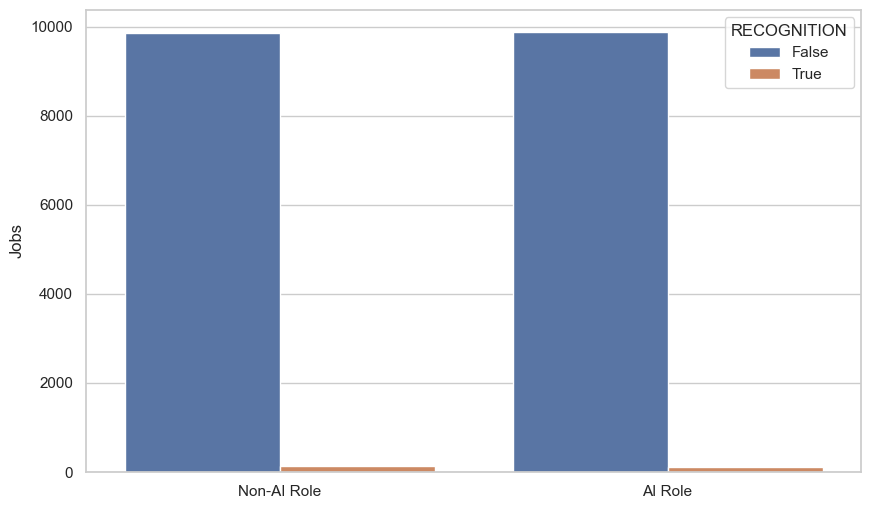

In [86]:
plot_counts(even_sample, 'RECOGNITION')

## Parental or Family Support



In [80]:
check_benefits(even_sample, family, 'FAMILY')

/var/folders/5k/j3bfrd8s2_l092hd5snmdbzm0000gn/T/ipykernel_52608/2902580251.py:3: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  df[benefit] = df['BODY'].str.contains(pattern, case=False, regex=True)


,Unnamed: 0,ID,CITY,CITY_NAME,COMPANY,COMPANY_NAME,COMPANY_RAW,COMPANY_IS_STAFFING,DUPLICATES,EDUCATION_LEVELS,...,MODELED_DURATION,FLEXIBILITY,HAS_AI_SKILLS,YEAR,CAREER_DEV,WLB,WELLBEING,RECOGNITION,FAMILY,CULTURE
0,794369,3f5e255af22d37ff77071a55351bd6c50283db65,Q2hpY2FnbywgSUw=,"Chicago, IL",43173610,Synchrony Bank,Synchrony Bank,False,0,[\n 2\n],...,37.0,False,True,2018,False,False,False,False,False,False
1,843192,610f91b1b99e79c630995df513108067a8f3c221,SmVyc2V5IENpdHksIE5K,"Jersey City, NJ",33553916,JPMorgan Chase,JPMorgan Chase Bank,False,0,[\n 4\n],...,34.0,False,True,2022,False,False,False,False,False,True
2,160635,85476d1c955592e4b5531a62c7b67ba92d52c4a5,RG9iYnMgRmVycnksIE5Z,"Dobbs Ferry, NY",36141914,Gwynedd Mercy University,Mercy University,False,3,"[\n 2,\n 3\n]",...,55.0,False,True,2023,False,False,False,False,False,False
3,347435,c509bbc7dbb3e7f3086abe243b5e9b5dcebf9521,V2FzaGluZ3RvbiwgREM=,"Washington, DC",38121853,Elevance Health,Anthem,False,0,"[\n 1,\n 2\n]",...,18.0,False,True,2022,False,True,True,False,False,True
4,693162,cc7c822628cc5d8dd345c8b356f5cbc01f5472d6,TW9udHBlbGllciwgVlQ=,"Montpelier, VT",2219962,American Express,American Express in Montpelier,False,0,[\n 99\n],...,32.0,False,True,2022,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,499492,89c21b4c7787da75c951052ff6e1b4c3bde46e6b,RnJlc25vLCBDQQ==,"Fresno, CA",83750164,Aerotek,Aerotek,True,1,[\n 99\n],...,29.0,False,False,2020,False,False,False,False,False,False
19996,773600,96705c16e2bb96ac7d60f22212c5b86d0eafe827,Tm9yd29vZCwgTUE=,"Norwood, MA",99459859,Moderna Therapeutics,Moderna,False,2,[\n 2\n],...,20.0,False,False,2021,False,False,False,False,False,False
19997,346402,e65eee74e6fdad25ef5683790bf4580750484abb,UmVkIEJhbmssIE5K,"Red Bank, NJ",36938321,Monmouth Day Care Center,MONMOUTH DAY CARE CENTER,False,0,[\n 0\n],...,41.0,False,False,2023,True,True,False,False,True,False
19998,671858,11112143f65e555a0f92b086b6982e891c9ae021,W1Vua25vd24gQ2l0eV0sIEtT,"[Unknown City], KS",11257336,Marriott International,Marriott,False,0,"[\n 0,\n 1\n]",...,36.0,False,False,2023,False,True,False,False,True,False


/var/folders/5k/j3bfrd8s2_l092hd5snmdbzm0000gn/T/ipykernel_29234/1579921570.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels)


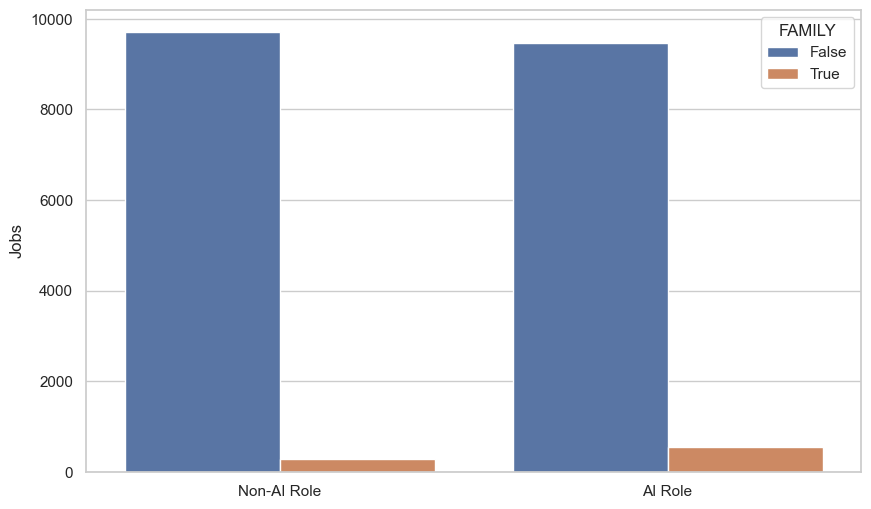

In [89]:
plot_counts(even_sample, 'FAMILY')

## Work Environment and Company Culture:  
Keywords: "collaborative environment," "diversity and inclusion," "team culture," "creative freedom," "values-driven"

In [38]:
check_benefits(even_sample, culture, 'CULTURE')

/var/folders/5k/j3bfrd8s2_l092hd5snmdbzm0000gn/T/ipykernel_32204/2902580251.py:3: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  df[benefit] = df['BODY'].str.contains(pattern, case=False, regex=True)


,ID,CITY,CITY_NAME,COMPANY,COMPANY_NAME,COMPANY_RAW,COMPANY_IS_STAFFING,DUPLICATES,EDUCATION_LEVELS,EDUCATION_LEVELS_NAME,...,MODELED_DURATION,FLEXIBILITY,HAS_AI_SKILLS,YEAR,CAREER_DEV,WLB,WELLBEING,RECOGNITION,FAMILY,CULTURE
794369,3f5e255af22d37ff77071a55351bd6c50283db65,Q2hpY2FnbywgSUw=,"Chicago, IL",43173610,Synchrony Bank,Synchrony Bank,False,0,[\n 2\n],"[\n ""Bachelor's degree""\n]",...,37.0,False,True,2018,False,False,False,False,False,False
843192,610f91b1b99e79c630995df513108067a8f3c221,SmVyc2V5IENpdHksIE5K,"Jersey City, NJ",33553916,JPMorgan Chase,JPMorgan Chase Bank,False,0,[\n 4\n],"[\n ""Ph.D. or professional degree""\n]",...,34.0,False,True,2022,False,False,False,False,False,True
160635,85476d1c955592e4b5531a62c7b67ba92d52c4a5,RG9iYnMgRmVycnksIE5Z,"Dobbs Ferry, NY",36141914,Gwynedd Mercy University,Mercy University,False,3,"[\n 2,\n 3\n]","[\n ""Bachelor's degree"",\n ""Master's degree""\n]",...,55.0,False,True,2023,False,False,False,False,False,False
347435,c509bbc7dbb3e7f3086abe243b5e9b5dcebf9521,V2FzaGluZ3RvbiwgREM=,"Washington, DC",38121853,Elevance Health,Anthem,False,0,"[\n 1,\n 2\n]","[\n ""Associate degree"",\n ""Bachelor's degree...",...,18.0,False,True,2022,False,True,True,False,False,True
693162,cc7c822628cc5d8dd345c8b356f5cbc01f5472d6,TW9udHBlbGllciwgVlQ=,"Montpelier, VT",2219962,American Express,American Express in Montpelier,False,0,[\n 99\n],"[\n ""No Education Listed""\n]",...,32.0,False,True,2022,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499492,89c21b4c7787da75c951052ff6e1b4c3bde46e6b,RnJlc25vLCBDQQ==,"Fresno, CA",83750164,Aerotek,Aerotek,True,1,[\n 99\n],"[\n ""No Education Listed""\n]",...,29.0,False,False,2020,False,False,False,False,False,False
773600,96705c16e2bb96ac7d60f22212c5b86d0eafe827,Tm9yd29vZCwgTUE=,"Norwood, MA",99459859,Moderna Therapeutics,Moderna,False,2,[\n 2\n],"[\n ""Bachelor's degree""\n]",...,20.0,False,False,2021,False,False,False,False,False,False
346402,e65eee74e6fdad25ef5683790bf4580750484abb,UmVkIEJhbmssIE5K,"Red Bank, NJ",36938321,Monmouth Day Care Center,MONMOUTH DAY CARE CENTER,False,0,[\n 0\n],"[\n ""High school or GED""\n]",...,41.0,False,False,2023,True,True,False,False,False,False
671858,11112143f65e555a0f92b086b6982e891c9ae021,W1Vua25vd24gQ2l0eV0sIEtT,"[Unknown City], KS",11257336,Marriott International,Marriott,False,0,"[\n 0,\n 1\n]","[\n ""High school or GED"",\n ""Associate degre...",...,36.0,False,False,2023,False,True,False,False,True,False


/var/folders/5k/j3bfrd8s2_l092hd5snmdbzm0000gn/T/ipykernel_29234/1579921570.py:7: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(labels)


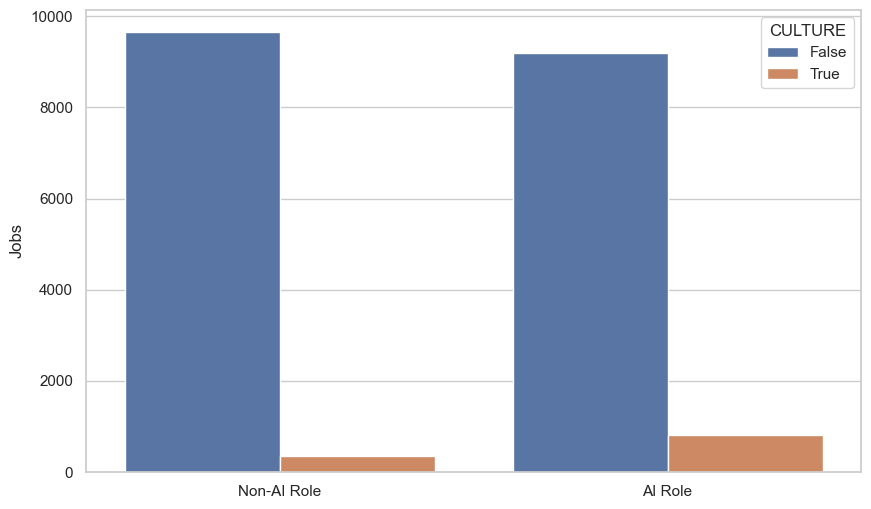

In [93]:
plot_counts(even_sample, 'CULTURE')

In [42]:
even_sample.to_csv('data/even_sample.csv')

# Plot Percentages

In [24]:
benefits = ['CAREER_DEV', 'WLB', 'WELLBEING', 'RECOGNITION', 'FAMILY', 'CULTURE']

In [81]:

# Calculate percentages for each benefit by HAS_AI_SKILLS
percentages = even_sample.groupby('HAS_AI_SKILLS')[benefits].mean() * 100

In [82]:
percentages

,CAREER_DEV,WLB,WELLBEING,RECOGNITION,FAMILY,CULTURE
HAS_AI_SKILLS,,,,,,
False,16.91,22.59,4.04,0.96,3.66,5.51
True,17.21,16.71,4.93,0.78,5.97,13.21


In [56]:
benefits_labels = "Career Development", "Work-Life Balance", "Well-being", "Recognition", "Family Support", "Culture"

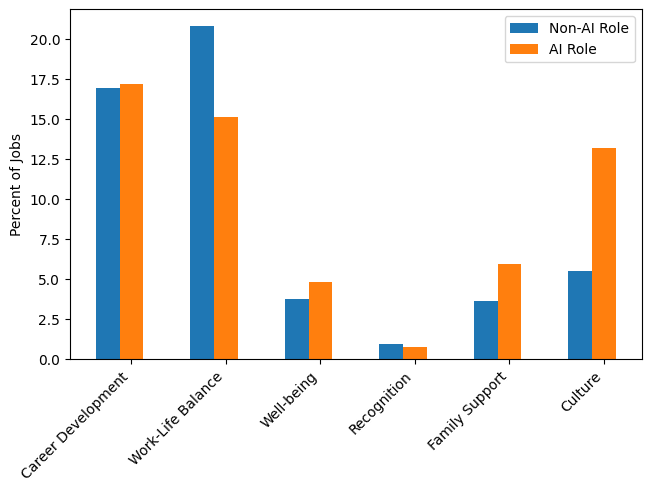

In [62]:
x = np.arange(len(benefits))
width = 0.25
multiplier = 0

fig, ax = plt.subplots(layout = 'constrained')
for attribute, value in percentages.iterrows():
    ax.bar(x + width*multiplier, value, width, label=attribute)
    multiplier += 1
    
ax.set_ylabel('Percent of Jobs')
ax.set_xticks(x+width, benefits_labels, rotation=45, ha = 'right')
ax.legend(loc = 'upper right', ncols = 2)
# change legend labels
ax.legend(['Non-AI Role', 'AI Role'])



In [140]:
years = even_sample['YEAR'].unique()

In [142]:
# sort years
years.sort()

In [143]:
years

array([2018, 2019, 2020, 2021, 2022, 2023, 2024], dtype=int32)

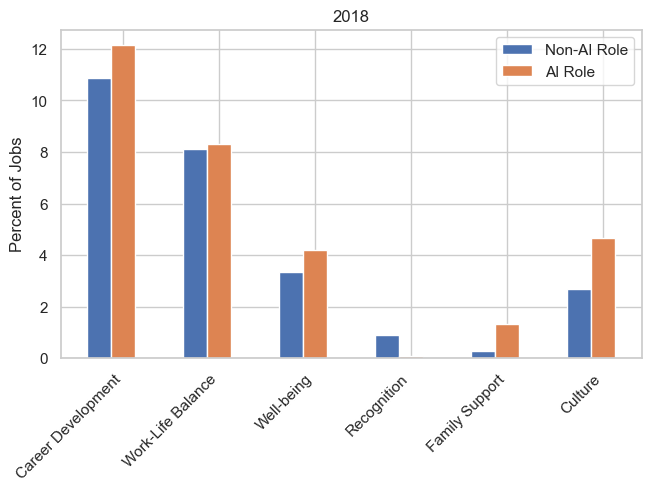

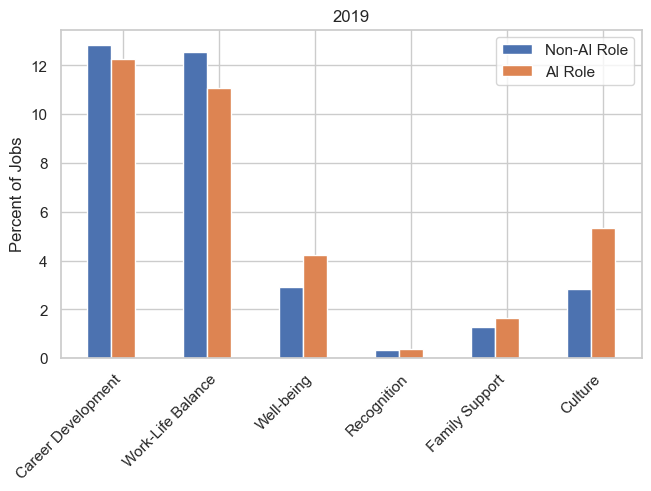

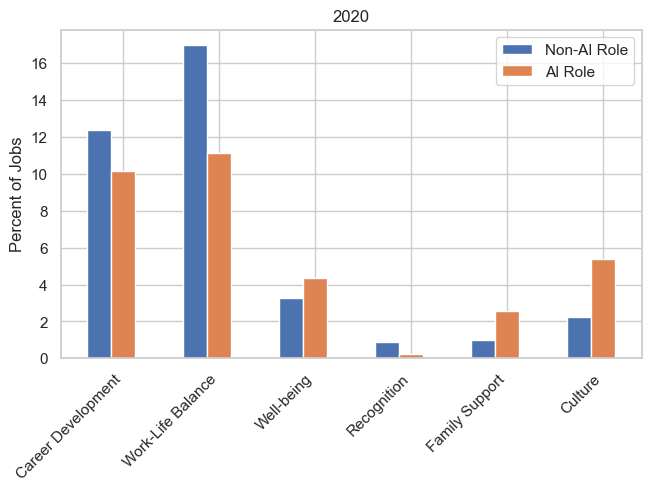

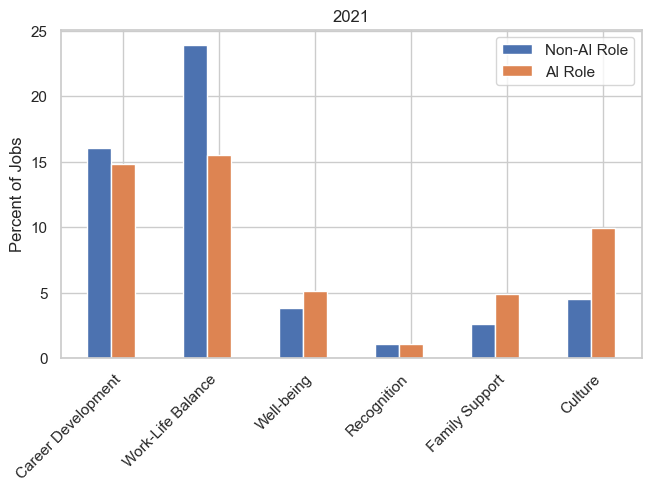

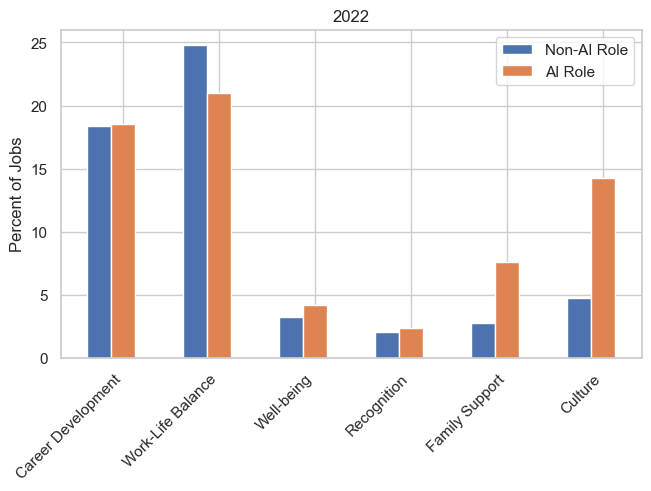

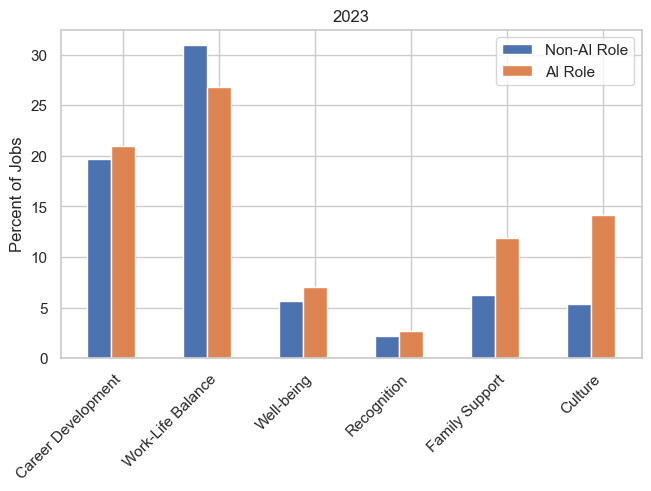

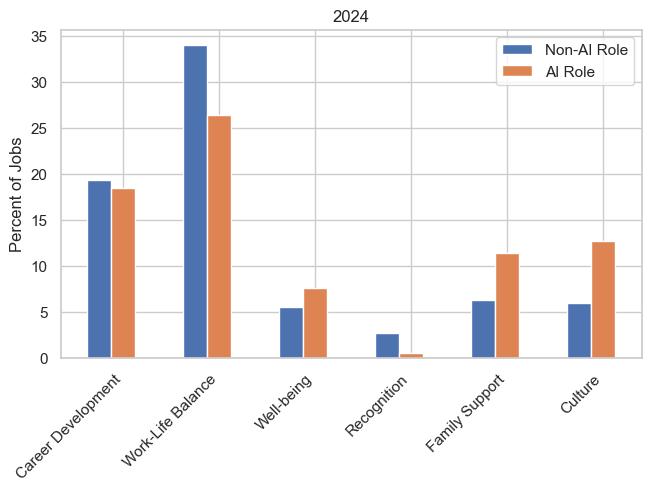

In [144]:
# create the same plot per year

for year in years:
    year_df = even_sample[even_sample['YEAR'] == year]
    percentages = year_df.groupby('HAS_AI_SKILLS')[benefits].mean() * 100
    x = np.arange(len(benefits))
    width = 0.25
    multiplier = 0

    fig, ax = plt.subplots(layout = 'constrained')
    for attribute, value in percentages.iterrows():
        ax.bar(x + width*multiplier, value, width, label=attribute)
        multiplier += 1

    ax.set_ylabel('Percent of Jobs')
    ax.set_xticks(x+width, benefits_labels, rotation=45, ha = 'right')
    ax.legend(loc = 'upper right', ncols = 2)
    ax.set_title(year)
    # change legend labels
    ax.legend(['Non-AI Role', 'AI Role'])

# Manual Check

In [210]:
test_sample = even_sample.sample(100, random_state=2)

In [37]:
def highlight_keywords_html(text, keywords):
    keywords = sorted(keywords, key=len, reverse=True)
    pattern = '|'.join(map(re.escape, keywords))
    found_keywords = re.findall(pattern, text, flags=re.IGNORECASE)

    # Replace keywords with bold version using HTML <b> tags
    highlighted_text = re.sub(r'(' + pattern + r')',r'<b><span style="background-color: yellow; color: black">\1</span></b>', text, flags=re.IGNORECASE)
    
    return highlighted_text, found_keywords

# Example for Jupyter Notebook (if you want to display HTML):
from IPython.display import display, HTML
for i in test_sample[test_sample['CAREER_DEV'] == True]['BODY']:
    highlighted_description_html = highlight_keywords_html(i, career_dev)
    display(HTML(highlighted_description_html))

AttributeError: 'tuple' object has no attribute 'lower'

## Loop through benefits

In [221]:
for benefit, keywords in zip(benefits, keywords_list):
    print(benefit)
    print('--'*100)
    for i in test_sample[test_sample[benefit] == True]['BODY']:
        highlighted_description_html = highlight_keywords_html(i, keywords)
        display(HTML(highlighted_description_html))

CAREER_DEV
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


WLB
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


WELLBEING
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


RECOGNITION
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


FAMILY
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


CULTURE
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


In [68]:
even_sample.rename(columns={'HAS_AI_SKILLS':'Has AI Skills'}, inplace=True)

## Check Larger Sample

In [116]:
for benefit, keywords in zip(benefits, keywords_list):
    print(benefit)
    print('--'*100)
    benefit_df = even_sample[even_sample[benefit] == True]
    test_sample = benefit_df.sample(25, random_state=2)
    for i in test_sample['BODY']:
        highlighted_description_html = highlight_keywords_html(i, keywords)
        display(HTML(highlighted_description_html))

CAREER_DEV
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


WLB
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


WELLBEING
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


RECOGNITION
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


FAMILY
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


CULTURE
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------


## Larger Sample 100 Per Benefit

In [22]:
# remove those already checked
checked_ids = []
for benefit, keywords in zip(benefits, keywords_list):
    print(benefit)
    print('--'*100)
    benefit_df = even_sample[even_sample[benefit] == True]
    test_sample = benefit_df.sample(25, random_state=2)
    # checked_ids.append(test_sample['ID'])
    for k, row in test_sample.iterrows():
        i = row['BODY']
        checked_ids.append(row['ID'])

        
# remove those already checked


CAREER_DEV
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WLB
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
WELLBEING
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
RECOGNITION
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
FAMILY
--------------------------------------------------------------------------------------------------------------------------------------------------------

In [24]:
len(checked_ids)

150

In [25]:
len(set(checked_ids))

149

In [27]:
even_sample['HAS_AI_SKILLS']

0         True
1         True
2         True
3         True
4         True
         ...  
19995    False
19996    False
19997    False
19998    False
19999    False
Name: HAS_AI_SKILLS, Length: 20000, dtype: bool

In [91]:
sample_notchecked = even_sample[~even_sample['ID'].isin(checked_ids)]


In [92]:
checked_ids_2 = []
check_df = pd.DataFrame(columns=['Benefit', 'ID', 'AI Role', 'Description'])
html_output = []
new_rows = []

for benefit, keywords in zip(benefits, keywords_list):
    print(benefit)
    print('--'*100)
    benefit_df = sample_notchecked[sample_notchecked[benefit] == True]
    test_sample = benefit_df.sample(75, random_state=2)
    html_output.append(f'{benefit}</h3>')
    for k, row in test_sample.iterrows():
        i = row['BODY']
        checked_ids_2.append(row['ID'])
        highlighted_description_html, found_keywords = highlight_keywords_html(i, keywords)
        job_id_html = f'<h3>Job ID: {row["ID"]}</h3>'
        description_html = f'<p>{highlighted_description_html}</p>'
            
        # Combine and append to output
        html_output.append(job_id_html + description_html)
        print(f'AI Role: {row["HAS_AI_SKILLS"]}')
        display(HTML(highlighted_description_html))
        # add to check_df
        new_row = {
            'Benefit': benefit,
            'ID': row['ID'],
            'AI Role': row['HAS_AI_SKILLS'],
            'Description': highlighted_description_html,
            'Keywords Found': ', '.join(found_keywords) 
        }
        new_rows.append(new_row)
        
# Convert the list of new rows into a DataFrame
check_df = pd.DataFrame(new_rows)

# Optionally export to a CSV file
check_df.to_csv('highlighted_job_postings.csv', index=False)
        
# export the highlighted_description_html HTML

final_html_content = '<html><body>' + '\n\n'.join(html_output) + '</body></html>'

with open('highlighted_descriptions.html', 'w', encoding='utf-8') as f:
    f.write(final_html_content)

CAREER_DEV
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
AI Role: False


AI Role: False


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: False


AI Role: False


AI Role: True


AI Role: False


AI Role: True


AI Role: False


AI Role: False


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: True


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: True


AI Role: False


AI Role: False


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: False


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: False


AI Role: True


AI Role: True


AI Role: False


AI Role: False


AI Role: True


AI Role: False


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: True


WLB
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
AI Role: False


AI Role: False


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: False


AI Role: True


AI Role: False


AI Role: True


AI Role: False


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: True


AI Role: False


AI Role: False


AI Role: True


AI Role: True


AI Role: False


AI Role: False


AI Role: True


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: True


AI Role: True


AI Role: False


AI Role: False


AI Role: False


AI Role: True


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: True


AI Role: False


AI Role: True


AI Role: False


AI Role: False


AI Role: False


AI Role: True


AI Role: False


AI Role: True


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: False


WELLBEING
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: False


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: True


AI Role: True


AI Role: False


AI Role: False


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: False


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: False


AI Role: True


AI Role: False


AI Role: False


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: False


AI Role: False


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: True


RECOGNITION
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: False


AI Role: True


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: False


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: False


AI Role: False


AI Role: False


AI Role: True


AI Role: True


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: True


AI Role: False


AI Role: False


AI Role: True


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: False


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: False


AI Role: True


AI Role: False


AI Role: False


AI Role: True


AI Role: False


AI Role: False


AI Role: False


AI Role: True


AI Role: False


AI Role: False


AI Role: True


AI Role: False


AI Role: False


AI Role: False


FAMILY
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: False


AI Role: True


AI Role: False


AI Role: False


AI Role: True


AI Role: True


AI Role: False


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: False


AI Role: True


AI Role: False


AI Role: False


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: False


AI Role: False


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: False


AI Role: False


AI Role: False


AI Role: True


CULTURE
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
AI Role: False


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: False


AI Role: False


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: False


AI Role: False


AI Role: False


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: True


AI Role: False


In [31]:
check_df.to_csv('data/check_df.csv')

# Count Keyword Occurrences

In [93]:
def count_keyword_occurrences(text, keywords):
    keyword_counts = {keyword: len(re.findall(r'\b' + re.escape(keyword) + r'\b', text, flags=re.IGNORECASE)) for keyword in keywords}
    return keyword_counts

In [95]:
all_keyword_counts = {}
for benefit, keywords in zip(benefits, keywords_list):
    print(f"Counting keywords for benefit: {benefit}")
    print('--' * 100)
    
    # Initialize a total keyword counter for the benefit
    total_keyword_counts = {keyword: 0 for keyword in keywords}
    
    # Loop through the job descriptions where the benefit is True
    for i in even_sample[even_sample[benefit] == True]['BODY']:
        # Count the occurrences of each keyword in the job description
        keyword_counts = count_keyword_occurrences(i, keywords)
        
        # Update the total counts for all job descriptions
        for keyword, count in keyword_counts.items():
            total_keyword_counts[keyword] += count
    all_keyword_counts[benefit] = total_keyword_counts
    # Print the total counts across all job descriptions for this benefit
    print(f"Total keyword occurrences for '{benefit}' across all job descriptions:")
    for keyword, count in total_keyword_counts.items():
        print(f"  {keyword}: {count}")
    print('\n')

Counting keywords for benefit: CAREER_DEV
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Total keyword occurrences for 'CAREER_DEV' across all job descriptions:
  training programs: 299
  education assistance: 121
  tuition reimbursement: 1044
  tuition assistance: 367
  mentorship: 477
  career growth: 483
  professional development: 1071
  leadership development: 183
  career advancement: 270
  leadership training: 26
  growth opportunities: 447
  personal development: 205


Counting keywords for benefit: WLB
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Total keyword occurrences for 'WLB' across all job descriptions:
  paid time off: 3101
  PTO: 1055
  extra vacation: 0
  flexibl

In [97]:
def plot_keyword_counts(total_keyword_counts, benefit):
    # Prepare data for plotting
    keywords = list(total_keyword_counts.keys())
    counts = list(total_keyword_counts.values())
    
    # Create the bar chart
    plt.figure(figsize=(10, 6))
    plt.barh(keywords, counts, color='skyblue')  # Horizontal bar chart
    plt.xlabel('Total Occurrences')
    plt.title(f"Total Keyword Occurrences for '{benefit}'")
    plt.gca().invert_yaxis()  # Invert y-axis for better readability
    plt.tight_layout()
    plt.savefig(f'figures/{benefit}_keywords.png')
    plt.show()

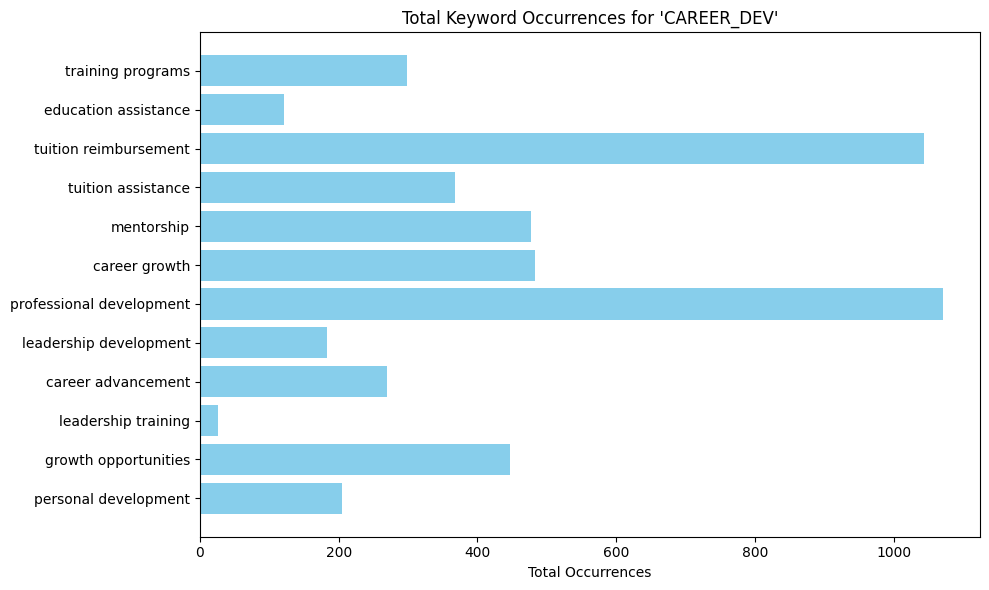

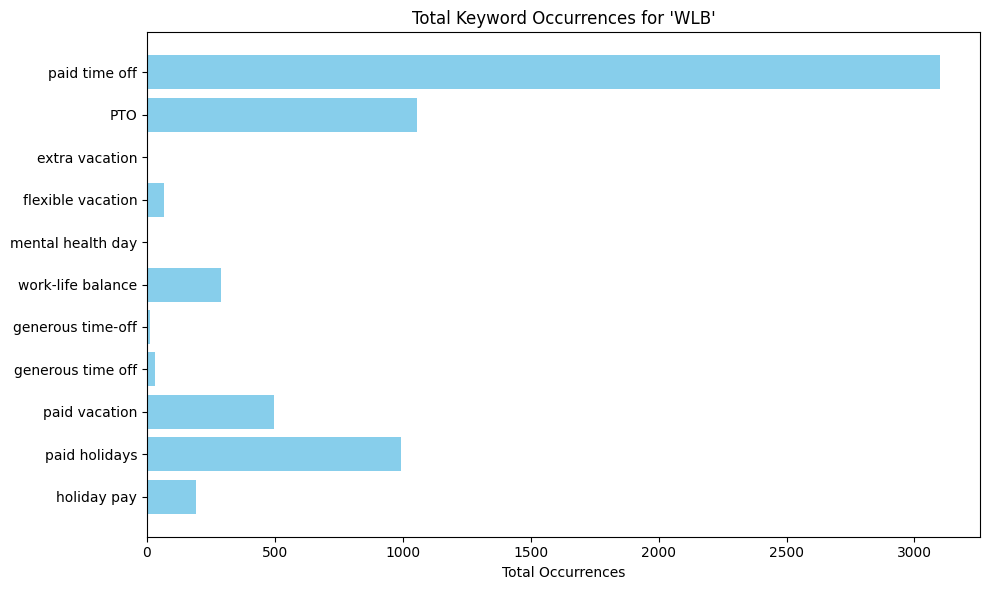

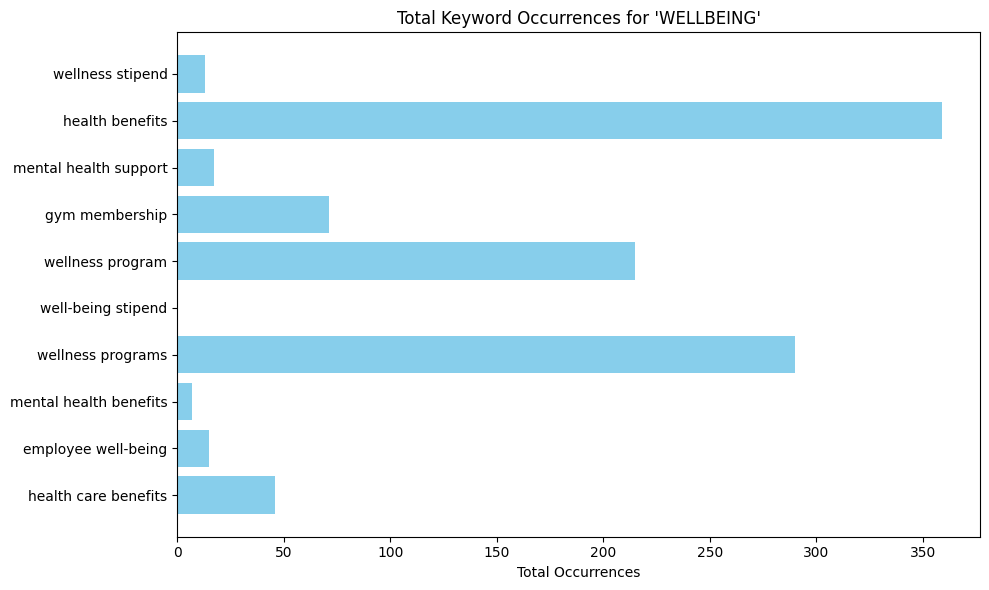

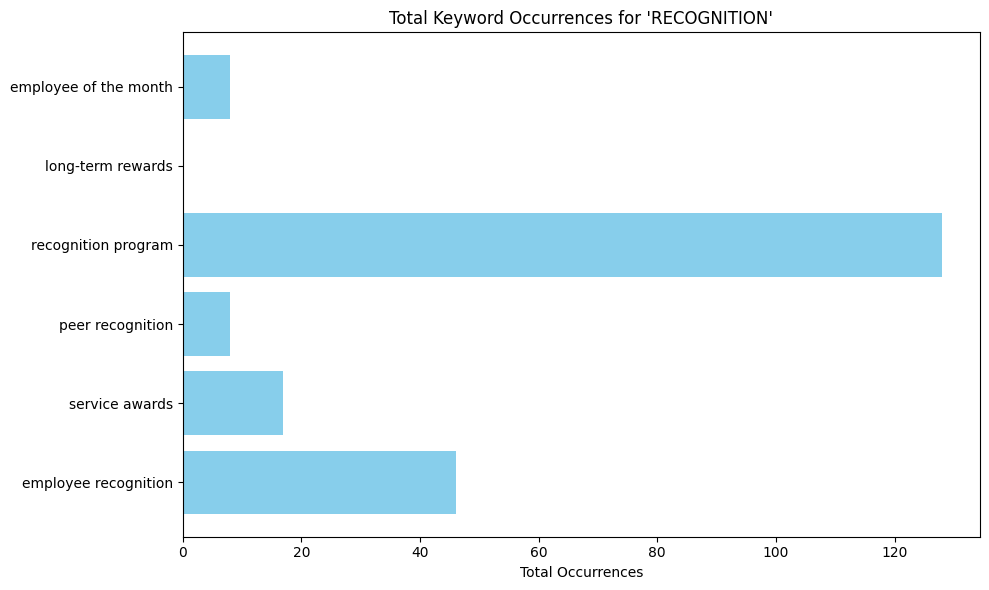

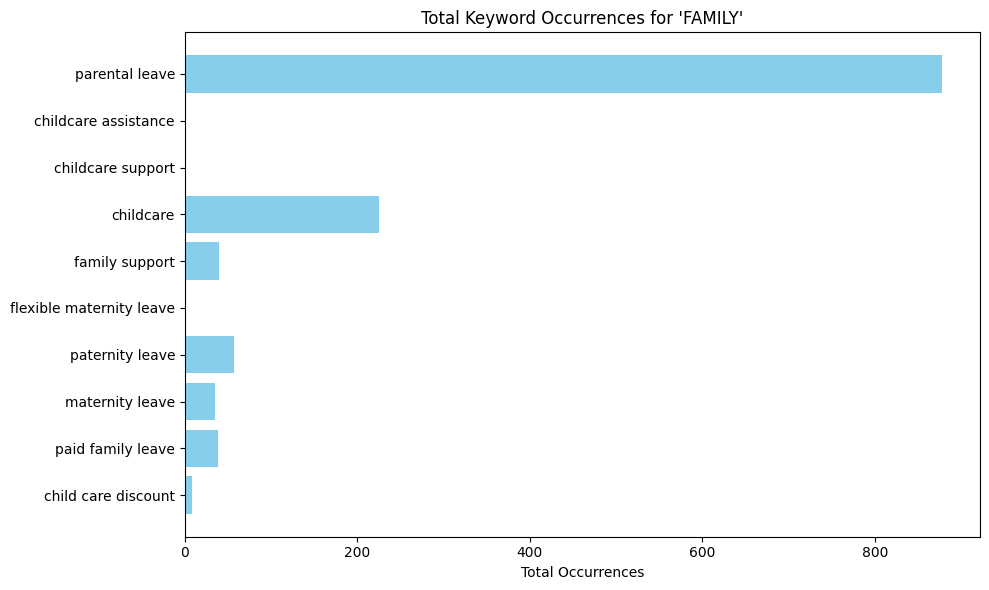

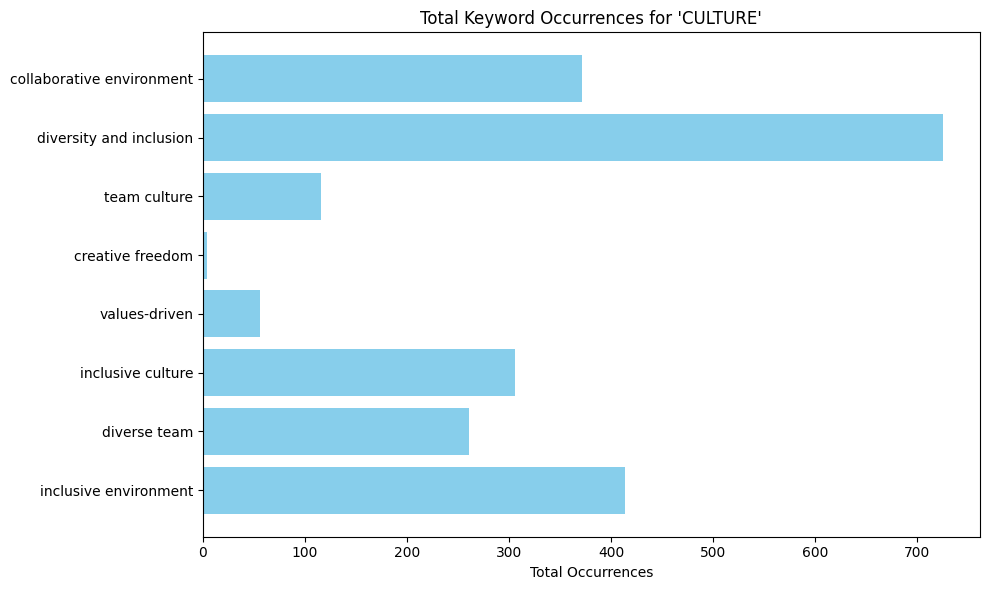

In [98]:
for benefit in all_keyword_counts:
    plot_keyword_counts(all_keyword_counts[benefit], benefit)
    # save plot

# Analyze Accuracy

In [100]:
!pip install openpyxl

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 250.9/250.9 kB 542.0 kB/s eta 0:00:00a 0:00:01


In [5]:
accuracy_df = pd.read_excel('../../highlighted_job_postings.xlsx')

In [148]:
accuracy_df

,Benefit,ID,AI Role,Description,Keywords Found,Unnamed: 5,Accurate?,Key phrases,Unnamed: 8,Unnamed: 9
0,CAREER_DEV,dd25750883039466d795ccf29c140dcfb768e9bf,True,Data Analytics Solution Consultant Job Listing...,"professional development, professional develop...",NaN,Y,NaN,no,NaN
1,CAREER_DEV,2cf803fd6d07732d7882e1fb3bbbb9306a711df2,False,Job Seekers / Browse Oregon Jobs / Job Display...,training programs,NaN,Y,NaN,no,NaN
2,CAREER_DEV,92bc5d9b1bf29b97a5701e7cdc098c4968be560c,True,Posting Title\n\nResearcher - Offshore Wind Tu...,"professional development, tuition reimbursemen...",NaN,Y,NaN,no,NaN
3,CAREER_DEV,72a69a38e4f77e02026c355501d6e3ead955627f,False,AT&T Wireless Sales Representative Prime Wirel...,Career Growth,NaN,Y,NaN,no,NaN
4,CAREER_DEV,a385e01219d19b37b256da5650a4ba2b64517e5a,False,Posting Duration:\n\nThis posting will be open...,Career advancement,NaN,Y,NaN,no,NaN
...,...,...,...,...,...,...,...,...,...,...
445,CULTURE,8c410a66a345057dbdb76882fb94ab8b5e0dac6e,True,11 hours\nBusiness Architect Senior Manager - ...,inclusive environment,NaN,Y,NaN,match,8c410a66a345057dbdb76882fb94ab8b5e0dac6e
446,CULTURE,2b9682ae65c5e857be9f41be3c02b99863652c0a,True,Ph.D. Fellowship: Diversity in AI for Good \n\...,diversity and inclusion,NaN,Y,Demonstrated commitment to promoting diversity...,match,2b9682ae65c5e857be9f41be3c02b99863652c0a
447,CULTURE,209d81a60a1880187beadf136cda84c7698e66fe,True,ZipApply\n\nHRS\n\nBiologist\n\nHRS Chesterfie...,collaborative environment,NaN,Y,This person will work in a collaborative envi...,match,209d81a60a1880187beadf136cda84c7698e66fe
448,CULTURE,39ab33c03c5c1c16242ff0801e83b0dfccc8d8da,True,"Manager, Software Engineering, Full Stack\nMil...",diversity and inclusion,NaN,Y,NaN,match,39ab33c03c5c1c16242ff0801e83b0dfccc8d8da


In [6]:
accuracy_df['is_accurate'] = accuracy_df['Accurate?'].map({'Y': True, 'N': False})

In [7]:
accuracy_df['Keywords Found'] = accuracy_df['Keywords Found'].str.lower()

In [8]:
# count accuracy by keyword using keywords_found column
accuracy_df['Keywords Found'] = accuracy_df['Keywords Found'].str.split(', ')


In [10]:
accuracy_df

,Benefit,ID,AI Role,Description,Keywords Found,Accurate?,Key phrases,Unnamed: 7,Unnamed: 8,is_accurate
0,CAREER_DEV,dd25750883039466d795ccf29c140dcfb768e9bf,1.0,Data Analytics Solution Consultant Job Listing...,"[professional development, professional develo...",Y,NaN,no,NaN,True
1,CAREER_DEV,2cf803fd6d07732d7882e1fb3bbbb9306a711df2,0.0,Job Seekers / Browse Oregon Jobs / Job Display...,[training programs],Y,NaN,no,NaN,True
2,CAREER_DEV,92bc5d9b1bf29b97a5701e7cdc098c4968be560c,1.0,Posting Title\n\nResearcher - Offshore Wind Tu...,"[professional development, tuition reimburseme...",Y,NaN,no,NaN,True
3,CAREER_DEV,72a69a38e4f77e02026c355501d6e3ead955627f,0.0,AT&T Wireless Sales Representative Prime Wirel...,[career growth],Y,NaN,no,NaN,True
4,CAREER_DEV,a385e01219d19b37b256da5650a4ba2b64517e5a,0.0,Posting Duration:\n\nThis posting will be open...,[career advancement],Y,NaN,no,NaN,True
...,...,...,...,...,...,...,...,...,...,...
570,CULTURE,NaN,NaN,NaN,NaN,Y,NaN,NaN,NaN,True
571,CULTURE,NaN,NaN,NaN,NaN,Y,NaN,NaN,NaN,True
572,CULTURE,NaN,NaN,NaN,NaN,Y,NaN,NaN,NaN,True
573,CULTURE,NaN,NaN,NaN,NaN,Y,NaN,NaN,NaN,True


In [11]:
accuracy_df['Keywords Found'].dropna(inplace=True)

In [ ]:
accuracy_df['Keywords Found'] = accuracy_df['Keywords Found'].apply(
    lambda x: list(set(x)) if pd.notna(x) else x
)

In [ ]:
accuracy_df['Keywords Found'].astype(str)

In [12]:
# remove duplicates in each Keywords Found row
accuracy_df['Keywords Found'] = accuracy_df['Keywords Found'].apply(lambda x: list(set(x)))


TypeError: 'float' object is not iterable

In [153]:
accuracy_df

,Benefit,ID,AI Role,Description,Keywords Found,Unnamed: 5,Accurate?,Key phrases,Unnamed: 8,Unnamed: 9,is_accurate
0,CAREER_DEV,dd25750883039466d795ccf29c140dcfb768e9bf,True,Data Analytics Solution Consultant Job Listing...,"[mentorship, professional development]",NaN,Y,NaN,no,NaN,True
1,CAREER_DEV,2cf803fd6d07732d7882e1fb3bbbb9306a711df2,False,Job Seekers / Browse Oregon Jobs / Job Display...,[training programs],NaN,Y,NaN,no,NaN,True
2,CAREER_DEV,92bc5d9b1bf29b97a5701e7cdc098c4968be560c,True,Posting Title\n\nResearcher - Offshore Wind Tu...,"[tuition reimbursement, professional development]",NaN,Y,NaN,no,NaN,True
3,CAREER_DEV,72a69a38e4f77e02026c355501d6e3ead955627f,False,AT&T Wireless Sales Representative Prime Wirel...,[career growth],NaN,Y,NaN,no,NaN,True
4,CAREER_DEV,a385e01219d19b37b256da5650a4ba2b64517e5a,False,Posting Duration:\n\nThis posting will be open...,[career advancement],NaN,Y,NaN,no,NaN,True
...,...,...,...,...,...,...,...,...,...,...,...
445,CULTURE,8c410a66a345057dbdb76882fb94ab8b5e0dac6e,True,11 hours\nBusiness Architect Senior Manager - ...,[inclusive environment],NaN,Y,NaN,match,8c410a66a345057dbdb76882fb94ab8b5e0dac6e,True
446,CULTURE,2b9682ae65c5e857be9f41be3c02b99863652c0a,True,Ph.D. Fellowship: Diversity in AI for Good \n\...,[diversity and inclusion],NaN,Y,Demonstrated commitment to promoting diversity...,match,2b9682ae65c5e857be9f41be3c02b99863652c0a,True
447,CULTURE,209d81a60a1880187beadf136cda84c7698e66fe,True,ZipApply\n\nHRS\n\nBiologist\n\nHRS Chesterfie...,[collaborative environment],NaN,Y,This person will work in a collaborative envi...,match,209d81a60a1880187beadf136cda84c7698e66fe,True
448,CULTURE,39ab33c03c5c1c16242ff0801e83b0dfccc8d8da,True,"Manager, Software Engineering, Full Stack\nMil...",[diversity and inclusion],NaN,Y,NaN,match,39ab33c03c5c1c16242ff0801e83b0dfccc8d8da,True


In [13]:
df_exploded = accuracy_df.explode('Keywords Found')

In [14]:
df_exploded

,Benefit,ID,AI Role,Description,Keywords Found,Accurate?,Key phrases,Unnamed: 7,Unnamed: 8,is_accurate
0,CAREER_DEV,dd25750883039466d795ccf29c140dcfb768e9bf,1.0,Data Analytics Solution Consultant Job Listing...,professional development,Y,NaN,no,NaN,True
0,CAREER_DEV,dd25750883039466d795ccf29c140dcfb768e9bf,1.0,Data Analytics Solution Consultant Job Listing...,professional development,Y,NaN,no,NaN,True
0,CAREER_DEV,dd25750883039466d795ccf29c140dcfb768e9bf,1.0,Data Analytics Solution Consultant Job Listing...,professional development,Y,NaN,no,NaN,True
0,CAREER_DEV,dd25750883039466d795ccf29c140dcfb768e9bf,1.0,Data Analytics Solution Consultant Job Listing...,mentorship,Y,NaN,no,NaN,True
1,CAREER_DEV,2cf803fd6d07732d7882e1fb3bbbb9306a711df2,0.0,Job Seekers / Browse Oregon Jobs / Job Display...,training programs,Y,NaN,no,NaN,True
...,...,...,...,...,...,...,...,...,...,...
570,CULTURE,NaN,NaN,NaN,NaN,Y,NaN,NaN,NaN,True
571,CULTURE,NaN,NaN,NaN,NaN,Y,NaN,NaN,NaN,True
572,CULTURE,NaN,NaN,NaN,NaN,Y,NaN,NaN,NaN,True
573,CULTURE,NaN,NaN,NaN,NaN,Y,NaN,NaN,NaN,True


In [15]:
# drop rows with NaN in Keywords Found
df_exploded.dropna(subset=['Keywords Found'], inplace=True)

In [16]:
df_exploded

,Benefit,ID,AI Role,Description,Keywords Found,Accurate?,Key phrases,Unnamed: 7,Unnamed: 8,is_accurate
0,CAREER_DEV,dd25750883039466d795ccf29c140dcfb768e9bf,1.0,Data Analytics Solution Consultant Job Listing...,professional development,Y,NaN,no,NaN,True
0,CAREER_DEV,dd25750883039466d795ccf29c140dcfb768e9bf,1.0,Data Analytics Solution Consultant Job Listing...,professional development,Y,NaN,no,NaN,True
0,CAREER_DEV,dd25750883039466d795ccf29c140dcfb768e9bf,1.0,Data Analytics Solution Consultant Job Listing...,professional development,Y,NaN,no,NaN,True
0,CAREER_DEV,dd25750883039466d795ccf29c140dcfb768e9bf,1.0,Data Analytics Solution Consultant Job Listing...,mentorship,Y,NaN,no,NaN,True
1,CAREER_DEV,2cf803fd6d07732d7882e1fb3bbbb9306a711df2,0.0,Job Seekers / Browse Oregon Jobs / Job Display...,training programs,Y,NaN,no,NaN,True
...,...,...,...,...,...,...,...,...,...,...
475,WELLBEING,NaN,NaN,NaN,health benefits,N,at one of America's leading health benefits co...,NaN,NaN,False
476,WELLBEING,NaN,NaN,NaN,wellness program,N,The Wellness Program Coordinator,NaN,NaN,False
477,WELLBEING,NaN,NaN,NaN,mental health support,N,have some familiarity with mental health supp...,NaN,NaN,False
478,WELLBEING,NaN,NaN,NaN,health benefits,N,leading dental health benefits administration,NaN,NaN,False


In [156]:
df_exploded[df_exploded['Keywords Found'] == 'family support']

,Benefit,ID,AI Role,Description,Keywords Found,Unnamed: 5,Accurate?,Key phrases,Unnamed: 8,Unnamed: 9,is_accurate
322,FAMILY,10d66c19fc0242a9d27337667f8906854bd39903,True,"Manager, Product Management - Machine Learning...",family support,NaN,Y,NaN,match,10d66c19fc0242a9d27337667f8906854bd39903,True
332,FAMILY,2f3b04eb1f923c4dcec557116b1ec3703db2e346,False,Onsite - Work onsite all of the time\nJob Summ...,family support,NaN,N,"Maui Family Support Services, Inc.",match,2f3b04eb1f923c4dcec557116b1ec3703db2e346,False


In [17]:
keyword_accuracy = df_exploded.groupby(['Benefit', 'Keywords Found']).agg(
    total_matches = ('is_accurate', 'size'), 
    total_accurate = ('is_accurate', 'sum'))


In [18]:
keyword_accuracy

total_matches  total_accurate
Benefit     Keywords Found                                          
CAREER_DEV  career advancement                     3               2
            career growth                         13              13
            education assistance                   1               1
            growth opportunities                   5               4
            leadership development                 8               4
            leadership training                    2               2
            mentorship                             7               3
            personal development                   3               3
            professional development              32              21
            training programs                      8               5
            tuition assistance                    10               9
            tuition reimbursement                 31              31
CULTURE     collaborative environment             15              13
            diverse team                          11              11
            diversity and inclusion               26              26
            inclusive culture                     15              15
            inclusive environment                 15              15
            team culture                           4               4
            values-driven                          2               2
FAMILY      child care discount                    1               1
            childcare                             10               5
            family support                         8               1
            maternity leave                        4               4
            paid family leave                      2               2
            parental leave                        70              70
            paternity leave                        6               6
RECOGNITION employee of the month                  1               1
            employee recognition                  21              14
            peer recognition                       3               3
            recognition program                   47              46
            service awards                         9               9
WELLBEING   gym membership                         3               3
            health benefits                       28              14
            health care benefits                   1               1
            mental health benefits                 1               1
            mental health support                  4               3
            wellness program                      26              25
            wellness programs                     26              26
WLB         generous time off                      1               1
            paid time off                         78              78
            paid vacation                          3               3
            pto                                   30              30
            work-life balance                     11              11

In [19]:
# only keep Benefit as index
keyword_accuracy = keyword_accuracy.reset_index(level=1)

In [20]:
keyword_accuracy['accuracy_percentage'] = (keyword_accuracy['total_accurate'] / keyword_accuracy['total_matches']) * 100

In [21]:
keyword_accuracy['total_inaccurate'] = keyword_accuracy['total_matches'] - keyword_accuracy['total_accurate']

In [22]:
# move Keywords Found out of index
keyword_accuracy.reset_index(inplace=True)

In [180]:
keyword_accuracy

,Benefit,Keywords Found,total_matches,total_accurate
0,CAREER_DEV,career advancement,3,2
1,CAREER_DEV,career growth,12,12
2,CAREER_DEV,education assistance,1,1
3,CAREER_DEV,growth opportunities,5,4
4,CAREER_DEV,leadership development,6,4
5,CAREER_DEV,leadership training,2,2
6,CAREER_DEV,mentorship,5,3
7,CAREER_DEV,personal development,3,3
8,CAREER_DEV,professional development,22,15
9,CAREER_DEV,training programs,6,5


FileNotFoundError: [Errno 2] No such file or directory: '/Users/alejandracastaneda/Library/CloudStorage/OneDrive-Nexus365/SkillScale/beyond-salary/notebooks/figures/CAREER_DEV_accuracy.png'

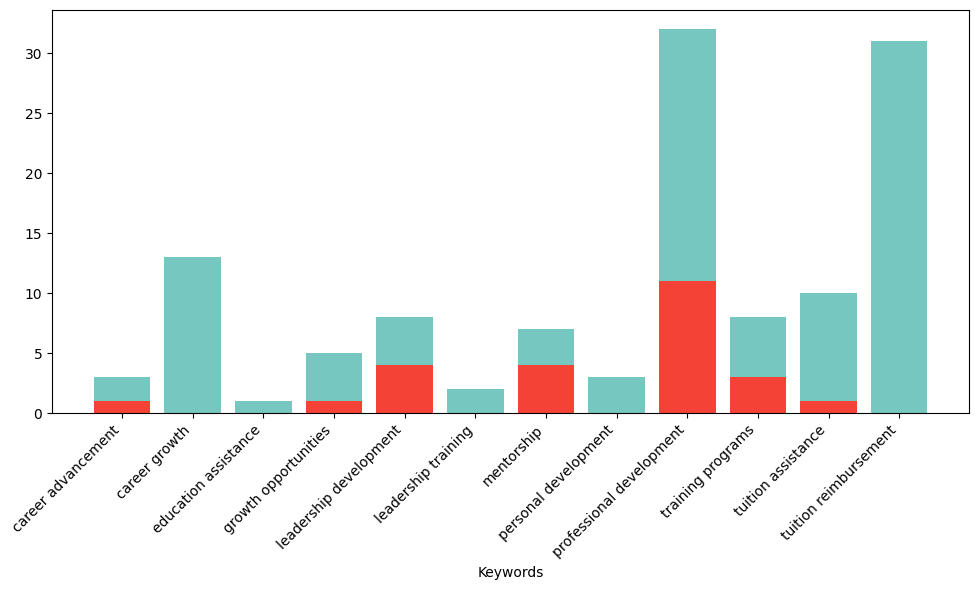

In [25]:
for benefit in benefits:
    benefit_df = keyword_accuracy[keyword_accuracy['Benefit'] == benefit]
    plt.figure(figsize=(10, 6))
    plt.bar(benefit_df['Keywords Found'], benefit_df['total_inaccurate'], color='#F44336', label = "Inaccurate Matches")
    plt.bar(benefit_df['Keywords Found'], benefit_df['total_accurate'], color='#76C7C0', bottom=benefit_df['total_inaccurate'], label = "Accurate Matches")
    plt.xlabel('Keywords')
    plt.xticks(rotation = 45, ha = 'right')
    plt.tight_layout()
    plt.savefig(f'figures/{benefit}_accuracy.png')

<Axes: xlabel='accuracy_percentage', ylabel='Keywords Found'>

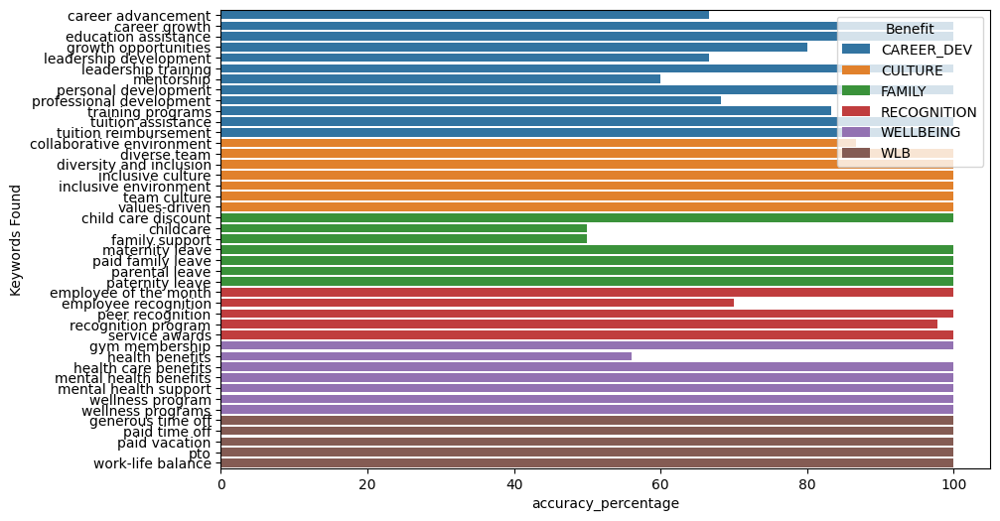

In [164]:
plt.figure(figsize=(10, 6))
sns.barplot(x='accuracy_percentage', y='Keywords Found', hue='Benefit', data=keyword_accuracy.reset_index())

# Benefits by Company

In [195]:
pd.set_option('display.max_columns', None)

In [196]:
even_sample

,Unnamed: 0,ID,CITY,CITY_NAME,COMPANY,COMPANY_NAME,COMPANY_RAW,COMPANY_IS_STAFFING,DUPLICATES,EDUCATION_LEVELS,EDUCATION_LEVELS_NAME,MIN_EDULEVELS,MIN_EDULEVELS_NAME,MAX_EDULEVELS,MAX_EDULEVELS_NAME,EMPLOYMENT_TYPE,EMPLOYMENT_TYPE_NAME,MIN_YEARS_EXPERIENCE,MAX_YEARS_EXPERIENCE,EXPIRED,IS_INTERNSHIP,LOCATION,COUNTY,COUNTY_NAME,MSA,MSA_NAME,STATE,STATE_NAME,NAICS2,NAICS2_NAME,NAICS3,NAICS3_NAME,NAICS4,NAICS4_NAME,NAICS5,NAICS5_NAME,NAICS6,NAICS6_NAME,DURATION,POSTED,TITLE,TITLE_NAME,TITLE_RAW,TITLE_CLEAN,BODY,SALARY,SKILLS,SKILLS_NAME,SPECIALIZED_SKILLS,SPECIALIZED_SKILLS_NAME,CERTIFICATIONS,CERTIFICATIONS_NAME,COMMON_SKILLS,COMMON_SKILLS_NAME,REMOTE_TYPE,REMOTE_TYPE_NAME,ONET,ONET_NAME,ONET_2019,ONET_2019_NAME,SOURCES,URL,ACTIVE_URLS,ACTIVE_SOURCES_INFO,SALARY_TO,SALARY_FROM,SOFTWARE_SKILLS,SOFTWARE_SKILLS_NAME,CIP6,CIP6_NAME,CIP4,CIP4_NAME,CIP2,CIP2_NAME,ORIGINAL_PAY_PERIOD,SOC_2021_2,SOC_2021_2_NAME,SOC_2021_3,SOC_2021_3_NAME,SOC_2021_4,SOC_2021_4_NAME,SOC_2021_5,SOC_2021_5_NAME,LOT_CAREER_AREA,LOT_CAREER_AREA_NAME,LOT_OCCUPATION,LOT_OCCUPATION_NAME,LOT_SPECIALIZED_OCCUPATION,LOT_SPECIALIZED_OCCUPATION_NAME,LOT_OCCUPATION_GROUP,LOT_OCCUPATION_GROUP_NAME,LOT_V6_SPECIALIZED_OCCUPATION,LOT_V6_SPECIALIZED_OCCUPATION_NAME,LOT_V6_OCCUPATION,LOT_V6_OCCUPATION_NAME,LOT_V6_OCCUPATION_GROUP,LOT_V6_OCCUPATION_GROUP_NAME,LOT_V6_CAREER_AREA,LOT_V6_CAREER_AREA_NAME,SOC_2,SOC_2_NAME,SOC_3,SOC_3_NAME,SOC_4,SOC_4_NAME,SOC_5,SOC_5_NAME,LAST_UPDATED_DATE,SOURCE_TYPES,LIGHTCAST_SECTORS,LIGHTCAST_SECTORS_NAME,NAICS_2017_2,NAICS_2017_2_NAME,NAICS_2017_3,NAICS_2017_3_NAME,NAICS_2017_4,NAICS_2017_4_NAME,NAICS_2017_5,NAICS_2017_5_NAME,NAICS_2017_6,NAICS_2017_6_NAME,NAICS_2022_2,NAICS_2022_2_NAME,NAICS_2022_3,NAICS_2022_3_NAME,NAICS_2022_4,NAICS_2022_4_NAME,NAICS_2022_5,NAICS_2022_5_NAME,NAICS_2022_6,NAICS_2022_6_NAME,MODELED_EXPIRED,MODELED_DURATION,FLEXIBILITY,HAS_AI_SKILLS,YEAR,CAREER_DEV,WLB,WELLBEING,RECOGNITION,FAMILY,CULTURE
0,794369,3f5e255af22d37ff77071a55351bd6c50283db65,Q2hpY2FnbywgSUw=,"Chicago, IL",43173610,Synchrony Bank,Synchrony Bank,False,0,[\n 2\n],"[\n ""Bachelor's degree""\n]",2,Bachelor's degree,NaN,NaN,1,Full-time (> 32 hours),5.0,NaN,2018-07-04,False,"{\n ""lat"": 41.8746,\n ""lon"": -87.6373\n}",17031.0,"Cook, IL",16980.0,"Chicago-Naperville-Elgin, IL-IN-WI",17,Illinois,52,Finance and Insurance,522,Credit Intermediation and Related Activities,5222,Nondepository Credit Intermediation,52222,Sales Financing,522220,Sales Financing,NaN,2018-05-04,ET93E8BFFD3AFB4D17,Big Data Engineers,"AVP, Big Data Engineer",avp big data engineer,"AVP, Big Data Engineer\n\nChicago, IL US\n\nSh...",NaN,"[\n ""KS122Q96S1LT3253TW3H"",\n ""KS1272Y6RFNZK...","[\n ""Data Warehousing"",\n ""NoSQL"",\n ""Apach...","[\n ""KS122Q96S1LT3253TW3H"",\n ""KS1272Y6RFNZK...","[\n ""Data Warehousing"",\n ""NoSQL"",\n ""Apach...",[],[],[],[],0,[None],15-1242.00,Database Administrators,15-1242.00,Database Administrators,"[\n ""jobsinnaperville.com""\n]","[\n ""http://www.jobsinnaperville.com/job/deta...",[],NaN,NaN,NaN,"[\n ""KS1272Y6RFNZKNGWDWMB"",\n ""KS124M479HR1F...","[\n ""NoSQL"",\n ""Apache HBase"",\n ""Apache Ha...","[\n ""14.0101"",\n ""11.0701"",\n ""14.0901""\n]","[\n ""Engineering, General"",\n ""Computer Scie...","[\n ""14.01"",\n ""11.07"",\n ""14.09""\n]","[\n ""Engineering, General"",\n ""Computer Scie...","[\n ""14"",\n ""11"",\n ""14""\n]","[\n ""Engineering"",\n ""Computer and Informati...",NaN,15-0000,Computer and Mathematical Occupations,15-1200,Computer Occupations,15-1240,Database and Network Administrators and Archit...,15-1242,Database Administrators,23.0,Information Technology and Computer Science,231210.0,Data Engineer,23121010.0,Data Engineer,2312.0,Database Specialists,23121010.0,Data Engineer,231210.0,Data Engineer,2312.0,Database Specialists,23.0,Information Technology and Computer Science,15-0000,Computer and Mathematical Occupations,15-1200,Computer Occupations,15-1240,Database and Network Administrators and Archit...,15-1242,Database A

In [198]:
for col in even_sample.columns:
    print(col)

Unnamed: 0
ID
CITY
CITY_NAME
COMPANY
COMPANY_NAME
COMPANY_RAW
COMPANY_IS_STAFFING
DUPLICATES
EDUCATION_LEVELS
EDUCATION_LEVELS_NAME
MIN_EDULEVELS
MIN_EDULEVELS_NAME
MAX_EDULEVELS
MAX_EDULEVELS_NAME
EMPLOYMENT_TYPE
EMPLOYMENT_TYPE_NAME
MIN_YEARS_EXPERIENCE
MAX_YEARS_EXPERIENCE
EXPIRED
IS_INTERNSHIP
LOCATION
COUNTY
COUNTY_NAME
MSA
MSA_NAME
STATE
STATE_NAME
NAICS2
NAICS2_NAME
NAICS3
NAICS3_NAME
NAICS4
NAICS4_NAME
NAICS5
NAICS5_NAME
NAICS6
NAICS6_NAME
DURATION
POSTED
TITLE
TITLE_NAME
TITLE_RAW
TITLE_CLEAN
BODY
SALARY
SKILLS
SKILLS_NAME
SPECIALIZED_SKILLS
SPECIALIZED_SKILLS_NAME
CERTIFICATIONS
CERTIFICATIONS_NAME
COMMON_SKILLS
COMMON_SKILLS_NAME
REMOTE_TYPE
REMOTE_TYPE_NAME
ONET
ONET_NAME
ONET_2019
ONET_2019_NAME
SOURCES
URL
ACTIVE_URLS
ACTIVE_SOURCES_INFO
SALARY_TO
SALARY_FROM
SOFTWARE_SKILLS
SOFTWARE_SKILLS_NAME
CIP6
CIP6_NAME
CIP4
CIP4_NAME
CIP2
CIP2_NAME
ORIGINAL_PAY_PERIOD
SOC_2021_2
SOC_2021_2_NAME
SOC_2021_3
SOC_2021_3_NAME
SOC_2021_4
SOC_2021_4_NAME
SOC_2021_5
SOC_2021_5_NAME
LOT_CA

CAREER_DEV


,COMPANY_RAW,0
0,Unknown,76
1,Deloitte,74
2,Guidehouse,47
3,Accenture,40
4,General Motors,31
5,IBM,19
6,General Electric,18
7,PwC,17
8,OREGON EMPLOYMENT DEPARTMENT,17
9,Jobot,17


WLB


,COMPANY_RAW,0
0,Unknown,96
1,CyberCoders,51
2,Guidehouse,47
3,"Anthem, Inc.",44
4,General Motors,32
5,Jobot,23
6,Walmart,22
7,USAA,19
8,Amazon,19
9,Humana,18


WELLBEING


,COMPANY_RAW,0
0,"Anthem, Inc.",74
1,"Anthem, Inc",41
2,Anthem,37
3,USAA,19
4,Unknown,18
5,Elevance Health,13
6,Leidos,13
7,"Compass Group, North America",10
8,Amazon,9
9,Walmart,7


RECOGNITION


,COMPANY_RAW,0
0,General Motors,29
1,Randstad,19
2,"Randstad North America, Inc.",8
3,Randstad US,6
4,Unknown,4
5,HCA Healthcare,4
6,Hudson Group,3
7,"ENSCO, Inc.",3
8,St. Marys Hospital,2
9,UNKNOWN,2


FAMILY


,COMPANY_RAW,0
0,Guidehouse,47
1,General Motors,29
2,Walmart,22
3,Unknown,17
4,Microsoft,12
5,Ford Motor Company,12
6,Cognizant Technology Solutions,8
7,Humana,7
8,Amazon,6
9,IBM,6


CULTURE


,COMPANY_RAW,0
0,Accenture,61
1,Capital One,59
2,Unknown,48
3,Deloitte,44
4,Verizon,19
5,KPMG,19
6,PwC,15
7,Dell,14
8,"Anthem, Inc.",14
9,"Amazon.com, Inc.",13


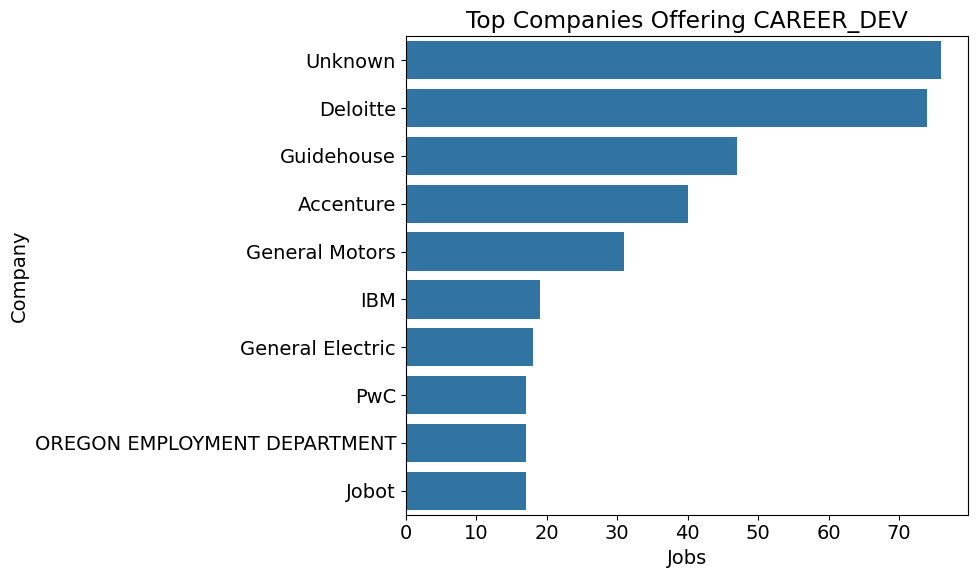

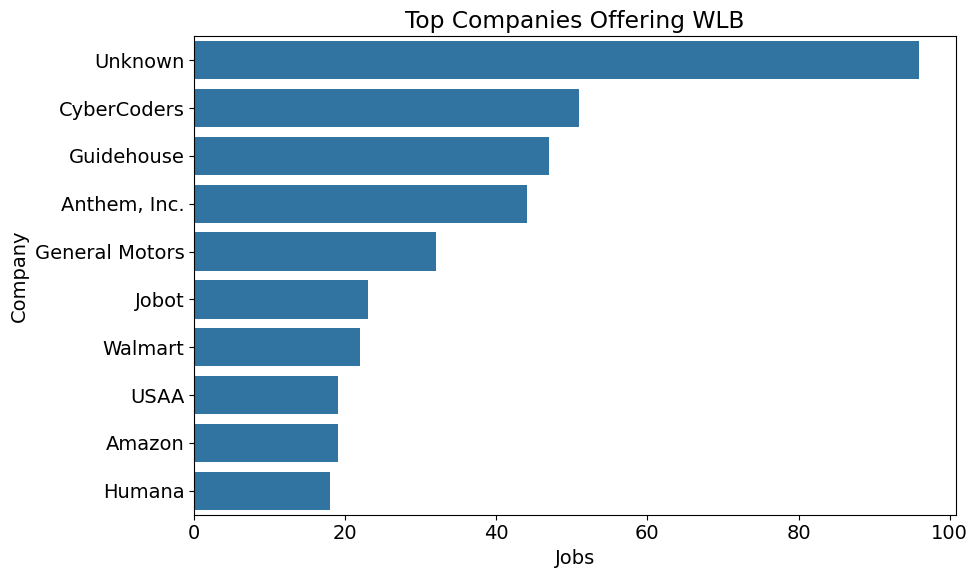

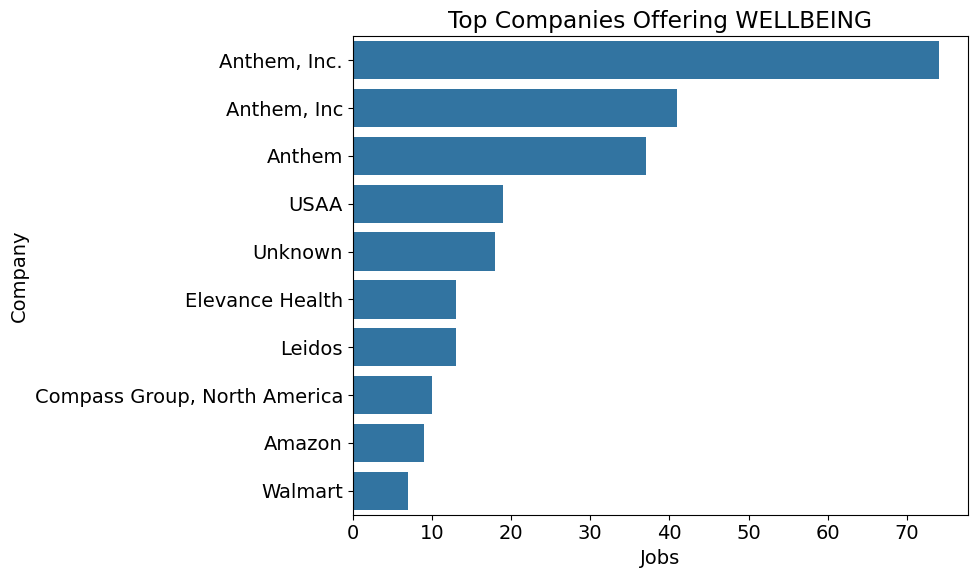

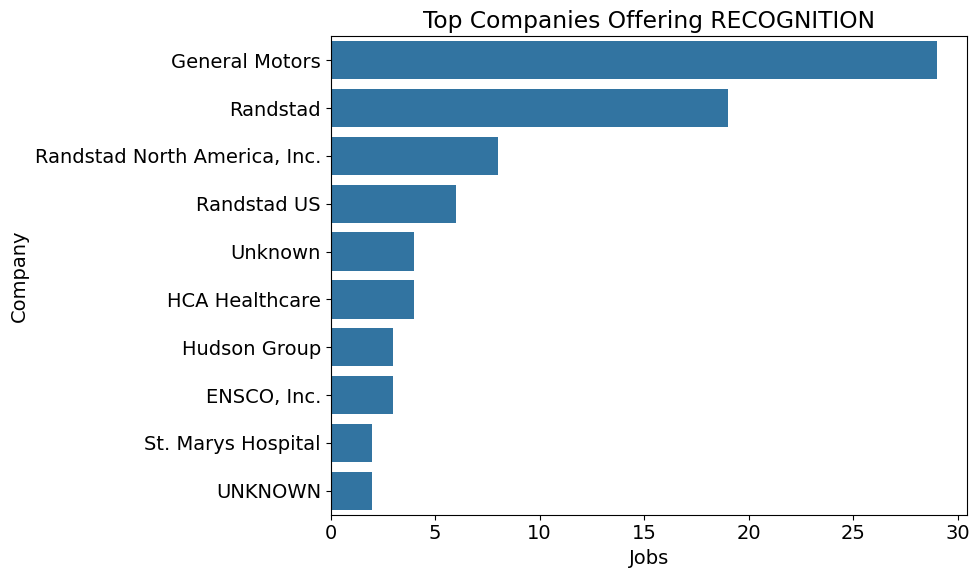

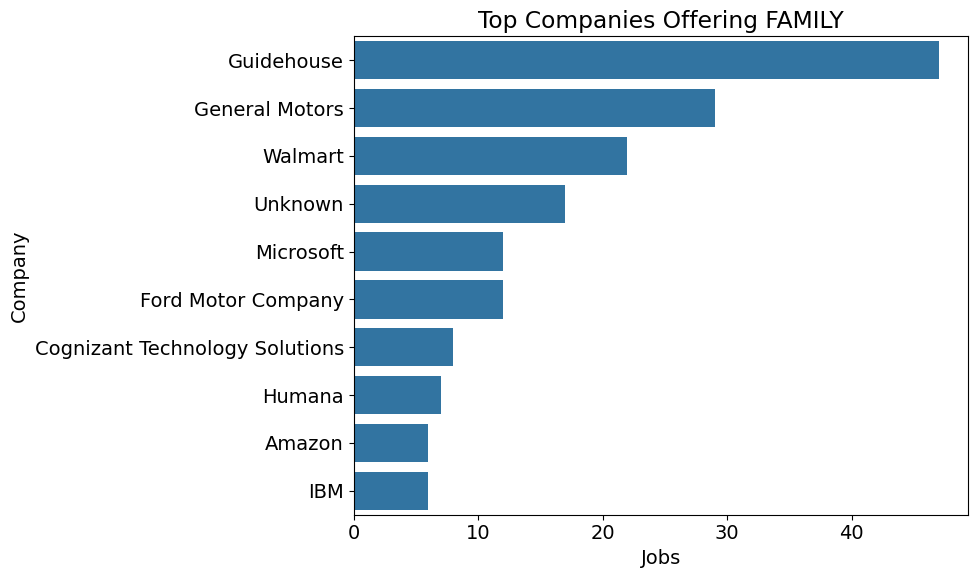

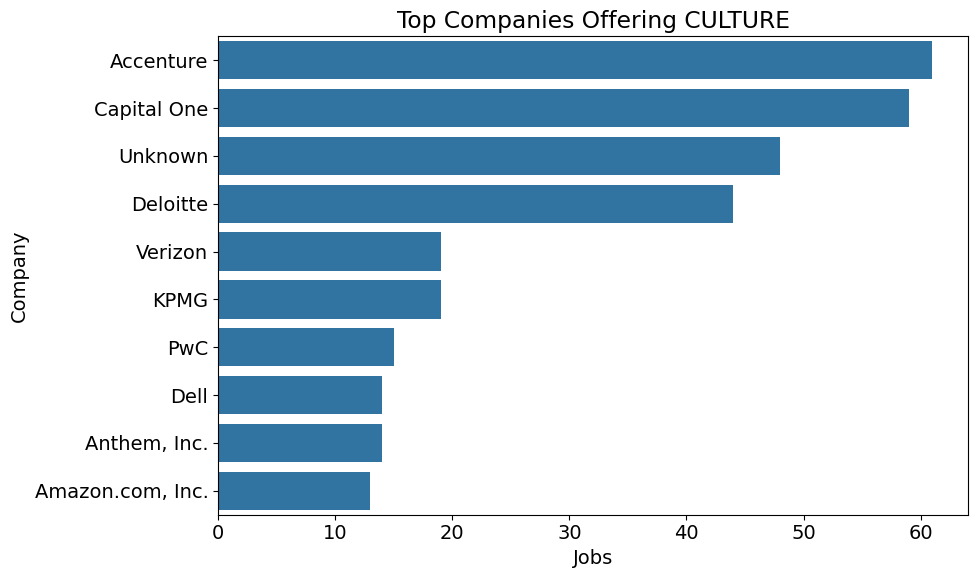

In [216]:
for benefit in benefits:
    benefit_df = even_sample[even_sample[benefit] == True]
    company_count = benefit_df.groupby('COMPANY_RAW').size().sort_values(ascending=False).reset_index()
    # plot
    plt.figure(figsize=(10, 6))
    sns.barplot(x=0, y='COMPANY_RAW', data=company_count.head(10))
    plt.xlabel('Jobs')
    plt.ylabel('Company')
    plt.title(f'Top Companies Offering {benefit}')
    plt.tight_layout()
    plt.savefig(f'figures/{benefit}_companies.png')
    print(benefit)
    display(company_count.head(10))

In [217]:
accenture = even_sample[even_sample['COMPANY_RAW'] == 'Accenture']
accenture.groupby('CULTURE').size()

CULTURE
False    50
True     61
dtype: int64

In [220]:
accenture[accenture['CULTURE']==True].groupby('TITLE_NAME').size().sort_values(ascending=False)

TITLE_NAME
Big Data Specialists                   2
Google Cloud Architects                2
Site Reliability Engineers             2
Connections Managers                   2
Data Science Consultants               2
Adobe Experience Manager Architects    1
SAP FICO Functional Analysts           1
Natural Resources Interns              1
Offering Managers                      1
Oracle Cloud Technical Consultants     1
Oracle Database Administrators         1
Responsible Engineers                  1
Robotic Process Automation Analysts    1
SAP ABAP Developers                    1
SAP Ariba Consultants                  1
SAP Basis Leads                        1
SAP Managers                           1
SAP HANA Consultants                   1
Manufacturing Managers                 1
Sales Performance Analysts             1
Salesforce Technical Architects        1
Security Automation Engineers          1
Strategy Consultants                   1
Supply Chain Strategy Managers         1
Susta

In [222]:
accenture[accenture['CULTURE']==False].groupby('TITLE_NAME').size().sort_values(ascending=False)

TITLE_NAME
Scientific Information Analysts        3
Artificial Intelligence Consultants    2
Operations Process Managers            2
Performance Excellence Managers        2
Quantitative Analytics Managers        2
Data Science Consultants               2
Artificial Intelligence Analysts       1
SAP Implementation Managers            1
Media Marketing Managers               1
Natural Gas Analysts                   1
Oracle Cloud Solution Architects       1
SAP Finance Professionals              1
Salesforce Consultants                 1
SAP Technical Architects               1
Life Sciences Account Managers         1
Summer Analysts                        1
Supply Chain Specialists               1
Systems Architects                     1
Technology Professionals               1
Technology Strategy Managers           1
Transactions Associates                1
Management Consulting Managers         1
Invoicing Managers                     1
Lead Application Developers            1
Artif

In [224]:
accenture

,Unnamed: 0,ID,CITY,CITY_NAME,COMPANY,COMPANY_NAME,COMPANY_RAW,COMPANY_IS_STAFFING,DUPLICATES,EDUCATION_LEVELS,EDUCATION_LEVELS_NAME,MIN_EDULEVELS,MIN_EDULEVELS_NAME,MAX_EDULEVELS,MAX_EDULEVELS_NAME,EMPLOYMENT_TYPE,EMPLOYMENT_TYPE_NAME,MIN_YEARS_EXPERIENCE,MAX_YEARS_EXPERIENCE,EXPIRED,IS_INTERNSHIP,LOCATION,COUNTY,COUNTY_NAME,MSA,MSA_NAME,STATE,STATE_NAME,NAICS2,NAICS2_NAME,NAICS3,NAICS3_NAME,NAICS4,NAICS4_NAME,NAICS5,NAICS5_NAME,NAICS6,NAICS6_NAME,DURATION,POSTED,TITLE,TITLE_NAME,TITLE_RAW,TITLE_CLEAN,BODY,SALARY,SKILLS,SKILLS_NAME,SPECIALIZED_SKILLS,SPECIALIZED_SKILLS_NAME,CERTIFICATIONS,CERTIFICATIONS_NAME,COMMON_SKILLS,COMMON_SKILLS_NAME,REMOTE_TYPE,REMOTE_TYPE_NAME,ONET,ONET_NAME,ONET_2019,ONET_2019_NAME,SOURCES,URL,ACTIVE_URLS,ACTIVE_SOURCES_INFO,SALARY_TO,SALARY_FROM,SOFTWARE_SKILLS,SOFTWARE_SKILLS_NAME,CIP6,CIP6_NAME,CIP4,CIP4_NAME,CIP2,CIP2_NAME,ORIGINAL_PAY_PERIOD,SOC_2021_2,SOC_2021_2_NAME,SOC_2021_3,SOC_2021_3_NAME,SOC_2021_4,SOC_2021_4_NAME,SOC_2021_5,SOC_2021_5_NAME,LOT_CAREER_AREA,LOT_CAREER_AREA_NAME,LOT_OCCUPATION,LOT_OCCUPATION_NAME,LOT_SPECIALIZED_OCCUPATION,LOT_SPECIALIZED_OCCUPATION_NAME,LOT_OCCUPATION_GROUP,LOT_OCCUPATION_GROUP_NAME,LOT_V6_SPECIALIZED_OCCUPATION,LOT_V6_SPECIALIZED_OCCUPATION_NAME,LOT_V6_OCCUPATION,LOT_V6_OCCUPATION_NAME,LOT_V6_OCCUPATION_GROUP,LOT_V6_OCCUPATION_GROUP_NAME,LOT_V6_CAREER_AREA,LOT_V6_CAREER_AREA_NAME,SOC_2,SOC_2_NAME,SOC_3,SOC_3_NAME,SOC_4,SOC_4_NAME,SOC_5,SOC_5_NAME,LAST_UPDATED_DATE,SOURCE_TYPES,LIGHTCAST_SECTORS,LIGHTCAST_SECTORS_NAME,NAICS_2017_2,NAICS_2017_2_NAME,NAICS_2017_3,NAICS_2017_3_NAME,NAICS_2017_4,NAICS_2017_4_NAME,NAICS_2017_5,NAICS_2017_5_NAME,NAICS_2017_6,NAICS_2017_6_NAME,NAICS_2022_2,NAICS_2022_2_NAME,NAICS_2022_3,NAICS_2022_3_NAME,NAICS_2022_4,NAICS_2022_4_NAME,NAICS_2022_5,NAICS_2022_5_NAME,NAICS_2022_6,NAICS_2022_6_NAME,MODELED_EXPIRED,MODELED_DURATION,FLEXIBILITY,HAS_AI_SKILLS,YEAR,CAREER_DEV,WLB,WELLBEING,RECOGNITION,FAMILY,CULTURE
82,689372,20e4526d9d34b4337b0dc79f53ceb770e517a720,QXJsaW5ndG9uLCBWQQ==,"Arlington, VA",8592955,Accenture,Accenture,False,1,[\n 2\n],"[\n ""Bachelor's degree""\n]",2,Bachelor's degree,NaN,NaN,1,Full-time (> 32 hours),3.0,NaN,2022-01-14,False,"{\n ""lat"": 38.8863,\n ""lon"": -77.0977\n}",51013.0,"Arlington, VA",47900.0,"Washington-Arlington-Alexandria, DC-VA-MD-WV",51,Virginia,54,"Professional, Scientific, and Technical Services",541,"Professional, Scientific, and Technical Services",5415,Computer Systems Design and Related Services,54151,Computer Systems Design and Related Services,541512,Computer Systems Design Services,NaN,2021-11-14,ETA7486D2AD729830C,Learning Managers,Learning and New Skilling Manager-South,learning and new skilling manager south,Learning and New Skilling Manager-South\n\nAcc...,143500.0,"[\n ""ESC842062C77758B1AED"",\n ""KS1218W78FGVP...","[\n ""Learning Strategies"",\n ""Management"",\n...","[\n ""ESC842062C77758B1AED"",\n ""ESC80C5E846C6...","[\n ""Learning Strategies"",\n ""Digital Transf...",[],[],"[\n ""KS1218W78FGVPVP2KXPX"",\n ""KS122B071LMGX...","[\n ""Management"",\n ""Consulting""\n]",0,[None],11-9199.00,"Managers, All Other",11-9199.00,"Managers, All Other","[\n ""indeed.com"",\n ""simplyhired.com""\n]","[\n ""https://www.simplyhired.com/job/d6lcrC52...",[],NaN,170000.0,117000.0,"[\n ""KS122FY73SVQX6J22KR1""\n]","[\n ""Learning Management Systems""\n]",[],[],[],[],[],[],year,11-0000,Management Occupations,11-9000,Other Management Occupations,11-9190,Miscellaneous Managers,11-9199,"Managers, All Other",23.0,Information Technology and Computer Science,231412.0,IT Project Manager,23141214.0,IT Project Manager (General),2314.0,IT Managers,23141214.0,IT Project Manager (General),231412.0,IT Project Manager,2314.0,IT Managers,23.0,Information Technology and Computer Science,11-0000,Management Occupations,11-9000,Other Management Occupations,11-9190,Miscellaneous Managers,11-9199,"Managers, All Other",2024-03-26,"[\n ""Job Board""\n]",[\n 7\n],"[\n ""Artificial Intelligence""\n]",54,"Professional,

In [226]:
accenture.groupby(['CULTURE','HAS_AI_SKILLS']).size()

CULTURE  HAS_AI_SKILLS
False    False             5
         True             45
True     False             6
         True             55
dtype: int64

# Run Models

In [56]:
run_logit_model(even_sample, dependent = 'CAREER_DEV', predictor='HAS_AI_SKILLS')

NameError: name 'pd' is not defined

In [ ]:
import statsmodels.api as sm

In [57]:
def run_logit_model(data, dependent, controls=[], binary_vars = [], predictor = 'Has AI Skills', ref_category = None, get_vif = False):
    """
    Runs a logistic regression model to predict work-from-home dependent status based on the specified predictor
    and control variables.

    Parameters:
    -----------
    controls : list of str
        A list of column names to be used as control variables. These variables will be converted to categorical
        variables and dummy variables will be created for them.
    predictor : str, default='Has AI Skills'
        The column name of the primary predictor variable.
    data : pd.DataFrame, default=data
        The DataFrame containing the data.
    ref_category : dict, optional
        A dictionary specifying the reference category for each control variable where keys are column names
        and values are the reference categories.

    Returns:
    --------
    logit_model : statsmodels.discrete.discrete_model.BinaryResultsWrapper
        The fitted logistic regression model.

    Example:
    --------
    >>> controls = ['region_column_name', 'industry_column_name']
    >>> model = run_wfh_logit(controls, predictor='Has AI Skills', data=data)
    >>> print(model.summary())
    """
    X = data[[predictor]]
    
    if binary_vars:
        for var in binary_vars:
            X = pd.concat([X, data[[var]]], axis = 1)
    
    if controls:
        for c in controls:    
            # Create categorical variables 
            data[c] = data[c].astype('category')
            
            # Create dummy variables with specified reference category
            if ref_category and c in ref_category:
                # Ensure the reference category is present in the data
                if ref_category[c] in data[c].cat.categories:
                    data[c] = data[c].cat.reorder_categories(
                        [ref_category[c]] + [cat for cat in data[c].cat.categories if cat != ref_category[c]],
                        ordered=True
                    )
                    dummies = pd.get_dummies(data[c], drop_first=True)
            # Create dummy variables
                else:
                    raise ValueError(f"Reference category '{ref_category[c]}' not found in column '{c}'")
            else:
                dummies = pd.get_dummies(data[c], drop_first=True)
            X = pd.concat([X, dummies], axis = 1)

    X = X.apply(pd.to_numeric, errors='coerce')

    y = data[dependent]
    data = pd.concat([X, y], axis=1).dropna()
    X = data.drop(columns = dependent)
    y = data[dependent]
    X = sm.add_constant(X)
    y = pd.to_numeric(y, errors='coerce')

    X.columns = X.columns.astype(str)

    X = X.astype(float)
    y = y.astype(float)
    # print(X)
    # print(X.corr())
    
    if get_vif:
        print("VIF Results")
        vif_data = []
        for i in tqdm(range(X.shape[1]), desc="Calculating VIF"):
            vif = variance_inflation_factor(X.values, i)
            vif_data.append(vif)
        vif = pd.DataFrame()
        vif["features"] = X.columns
        vif["VIF"] = vif_data
        print(vif)
    
    logit_model = sm.Logit(y, X).fit()

    # Print the summary of the model
    print(logit_model.summary())
    # print(summary_col(logit_model, stars=True, float_format='%0.2f'))
    return logit_model

In [60]:
run_logit_model(even_sample, dependent = 'CAREER_DEV', predictor='Has AI Skills')

Optimization terminated successfully.
         Current function value: 0.449890
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:             CAREER_DEV   No. Observations:                20000
Model:                          Logit   Df Residuals:                    19998
Method:                           MLE   Df Model:                            1
Date:                Mon, 30 Sep 2024   Pseudo R-squ.:               9.822e-07
Time:                        16:53:26   Log-Likelihood:                -8997.8
converged:                       True   LL-Null:                       -8997.8
Covariance Type:            nonrobust   LLR p-value:                    0.8942
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -1.6150      0.027    -60.075      0.000      -1.668      -1.562
HAS_AI_SKILLS     0.

In [62]:
region = 'STATE_NAME'
industry = 'NAICS_2022_2_NAME'
education = 'MIN_EDULEVELS_NAME'
year = 'YEAR'
occupation = 'SOC_2021_2_NAME'
experience = 'experience_bucket'

In [63]:
run_logit_model(even_sample, dependent = 'CAREER_DEV', predictor='HAS_AI_SKILLS', controls = [year, occupation, industry])

Optimization terminated successfully.
         Current function value: 0.436649
         Iterations 17
                           Logit Regression Results                           
Dep. Variable:             CAREER_DEV   No. Observations:                20000
Model:                          Logit   Df Residuals:                    19949
Method:                           MLE   Df Model:                           50
Date:                Mon, 30 Sep 2024   Pseudo R-squ.:                 0.02943
Time:                        16:56:07   Log-Likelihood:                -8733.0
converged:                       True   LL-Null:                       -8997.8
Covariance Type:            nonrobust   LLR p-value:                 2.460e-81
                                                                               coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------

In [71]:
benefit_models = []
for benefit in benefits:
    print(benefit)
    print('--'*100)
    model = run_logit_model(even_sample, dependent = benefit, predictor='Has AI Skills', controls = [year, occupation])
    benefit_models.append(model)

CAREER_DEV
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Optimization terminated successfully.
         Current function value: 0.440721
         Iterations 17
                           Logit Regression Results                           
Dep. Variable:             CAREER_DEV   No. Observations:                20000
Model:                          Logit   Df Residuals:                    19969
Method:                           MLE   Df Model:                           30
Date:                Mon, 30 Sep 2024   Pseudo R-squ.:                 0.02038
Time:                        17:07:39   Log-Likelihood:                -8814.4
converged:                       True   LL-Null:                       -8997.8
Covariance Type:            nonrobust   LLR p-value:                 1.379e-59
                                                     

/Users/alejandracastaneda/anaconda3/envs/thesisenv/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.171992
         Iterations: 35
                           Logit Regression Results                           
Dep. Variable:              WELLBEING   No. Observations:                20000
Model:                          Logit   Df Residuals:                    19969
Method:                           MLE   Df Model:                           30
Date:                Mon, 30 Sep 2024   Pseudo R-squ.:                 0.01911
Time:                        17:07:40   Log-Likelihood:                -3439.8
converged:                      False   LL-Null:                       -3506.8
Covariance Type:            nonrobust   LLR p-value:                 4.212e-15
                                                                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------
const                                           

/Users/alejandracastaneda/anaconda3/envs/thesisenv/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Optimization terminated successfully.
         Current function value: 0.148399
         Iterations 9
                           Logit Regression Results                           
Dep. Variable:            RECOGNITION   No. Observations:                20000
Model:                          Logit   Df Residuals:                    19969
Method:                           MLE   Df Model:                           30
Date:                Mon, 30 Sep 2024   Pseudo R-squ.:                 0.04065
Time:                        17:07:41   Log-Likelihood:                -2968.0
converged:                       True   LL-Null:                       -3093.8
Covariance Type:            nonrobust   LLR p-value:                 7.640e-37
                                                                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------
const       

/Users/alejandracastaneda/anaconda3/envs/thesisenv/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.289809
         Iterations: 35
                           Logit Regression Results                           
Dep. Variable:                CULTURE   No. Observations:                20000
Model:                          Logit   Df Residuals:                    19969
Method:                           MLE   Df Model:                           30
Date:                Mon, 30 Sep 2024   Pseudo R-squ.:                 0.06751
Time:                        17:07:42   Log-Likelihood:                -5796.2
converged:                      False   LL-Null:                       -6215.8
Covariance Type:            nonrobust   LLR p-value:                3.650e-157
                                                                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------------
const                                           

/Users/alejandracastaneda/anaconda3/envs/thesisenv/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [78]:
coefficients = []
errors = []
pvalues = []
for model in benefit_models:
    # Extract the coefficient and standard error for 'AI_skill'
    coef = model.params['Has AI Skills']
    err = model.bse['Has AI Skills']
    pvalue = model.pvalues['Has AI Skills'].round(3)
    coefficients.append(coef)
    errors.append(err)
    pvalues.append(pvalue)

# Creating DataFrame
results = {
    'Label': benefits,
    'Coefficient': coefficients,
    'Error': errors,
    'P-Value': pvalues
}

results_df = pd.DataFrame(results)



In [79]:
results_df

,Label,Coefficient,Error,P-Value
0,CAREER_DEV,0.116036,0.048395,0.016
1,WLB,-0.248177,0.050078,0.000
2,WELLBEING,0.294897,0.090546,0.001
3,RECOGNITION,-0.114419,0.101180,0.258
4,FAMILY,0.612483,0.096137,0.000
5,CULTURE,0.767740,0.064419,0.000


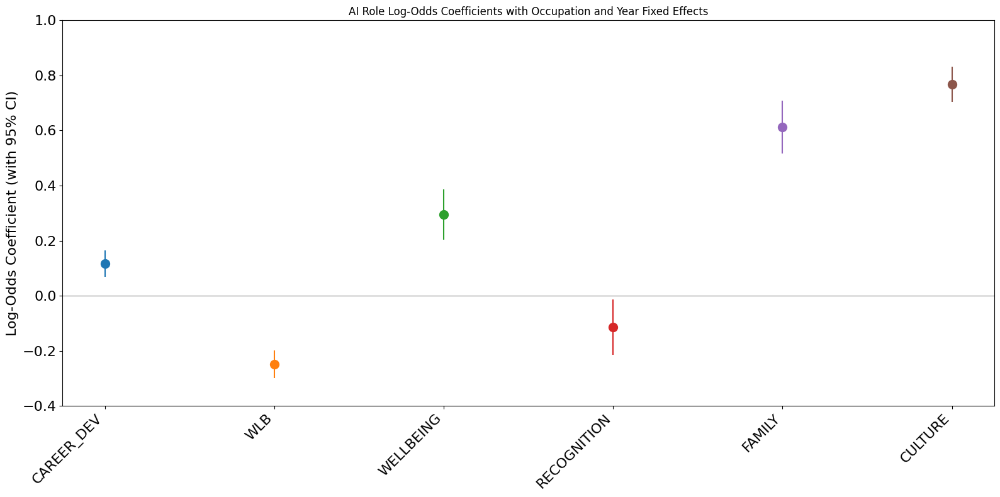

In [97]:
fig, ax = plt.subplots(figsize=(16, 8))
# Define colors for the 9 AI skills categories
# colors = ['#E69F00', '#56B4E9', '#009E73', '#CC79A7', '#F0E442', '#0072B2', '#D55E00', '#CC79A7', '#999999']
cmap = plt.get_cmap("tab10")
colors = [cmap(i) for i in range(len(results_df))]
# Plot each AI skill category
for i, row in results_df.iterrows():
    ax.errorbar(
        i, row['Coefficient'], 
        yerr=row['Error'], 
        fmt='o', color=colors[i], label=row['Label'], markersize = 10
    )

# Customize plot
ax.set_xticks(range(len(results_df)))
ax.set_xticklabels(results_df['Label'], rotation=45, ha='right', fontsize = 16)
# ax.set_title('Coefficients for 9 AI Skills Categories')
# ax.set_xlabel('AI Skills Categories', fontsize = 18)
ax.set_ylabel('Log-Odds Coefficient (with 95% CI)', fontsize = 16)
ax.axhline(0, color='grey', linewidth=0.8)
# ax.axhline(average_coefficient, color='grey', linestyle='--', linewidth=1, label='Average Coefficient')

# Increase the size of y-ticks
ax.tick_params(axis='y', labelsize=16)
ax.set_title('AI Role Log-Odds Coefficients with Occupation and Year Fixed Effects')
ax.set_ylim(-0.4, 1.0)
# Add legend
# ax.legend(title='AI Skills', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize = 16, title_fontsize = 16)

plt.tight_layout() 
plt.show()

## Industry Control

In [80]:
benefit_models_2 = []
for benefit in benefits:
    print(benefit)
    print('--'*100)
    model = run_logit_model(even_sample, dependent = benefit, predictor='Has AI Skills', controls = [year, industry])
    benefit_models_2.append(model)

CAREER_DEV
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Optimization terminated successfully.
         Current function value: 0.438898
         Iterations 7
                           Logit Regression Results                           
Dep. Variable:             CAREER_DEV   No. Observations:                20000
Model:                          Logit   Df Residuals:                    19972
Method:                           MLE   Df Model:                           27
Date:                Mon, 30 Sep 2024   Pseudo R-squ.:                 0.02443
Time:                        17:12:55   Log-Likelihood:                -8778.0
converged:                       True   LL-Null:                       -8997.8
Covariance Type:            nonrobust   LLR p-value:                 3.914e-76
                                                      

/Users/alejandracastaneda/anaconda3/envs/thesisenv/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


         Current function value: 0.147257
         Iterations: 35
                           Logit Regression Results                           
Dep. Variable:            RECOGNITION   No. Observations:                20000
Model:                          Logit   Df Residuals:                    19972
Method:                           MLE   Df Model:                           27
Date:                Mon, 30 Sep 2024   Pseudo R-squ.:                 0.04804
Time:                        17:12:57   Log-Likelihood:                -2945.1
converged:                      False   LL-Null:                       -3093.8
Covariance Type:            nonrobust   LLR p-value:                 2.602e-47
                                                                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------------------------------------
const               

/Users/alejandracastaneda/anaconda3/envs/thesisenv/lib/python3.12/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Optimization terminated successfully.
         Current function value: 0.152440
         Iterations 34
                           Logit Regression Results                           
Dep. Variable:                 FAMILY   No. Observations:                20000
Model:                          Logit   Df Residuals:                    19972
Method:                           MLE   Df Model:                           27
Date:                Mon, 30 Sep 2024   Pseudo R-squ.:                 0.09574
Time:                        17:12:58   Log-Likelihood:                -3048.8
converged:                       True   LL-Null:                       -3371.6
Covariance Type:            nonrobust   LLR p-value:                9.073e-119
                                                                               coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------

In [81]:
coefficients = []
errors = []
pvalues = []
for model in benefit_models_2:
    # Extract the coefficient and standard error for 'AI_skill'
    coef = model.params['Has AI Skills']
    err = model.bse['Has AI Skills']
    pvalue = model.pvalues['Has AI Skills'].round(3)
    coefficients.append(coef)
    errors.append(err)
    pvalues.append(pvalue)

# Creating DataFrame
results_2 = {
    'Label': benefits,
    'Coefficient': coefficients,
    'Error': errors,
    'P-Value': pvalues
}

results_df_2 = pd.DataFrame(results_2)



In [82]:
results_df_2

,Label,Coefficient,Error,P-Value
0,CAREER_DEV,0.026012,0.041880,0.535
1,WLB,-0.249792,0.043108,0.000
2,WELLBEING,0.142637,0.078531,0.069
3,RECOGNITION,-0.356868,0.083979,0.000
4,FAMILY,0.646620,0.084769,0.000
5,CULTURE,0.716110,0.057519,0.000


In [83]:
results_df_2

,Label,Coefficient,Error,P-Value
0,CAREER_DEV,0.026012,0.041880,0.535
1,WLB,-0.249792,0.043108,0.000
2,WELLBEING,0.142637,0.078531,0.069
3,RECOGNITION,-0.356868,0.083979,0.000
4,FAMILY,0.646620,0.084769,0.000
5,CULTURE,0.716110,0.057519,0.000


In [89]:
from stargazer.stargazer import Stargazer
from IPython.core.display import HTML


In [85]:
stargazer = Stargazer(benefit_models)

In [87]:
stargazer2 = Stargazer(benefit_models_2)

In [90]:
HTML(stargazer.render_html())

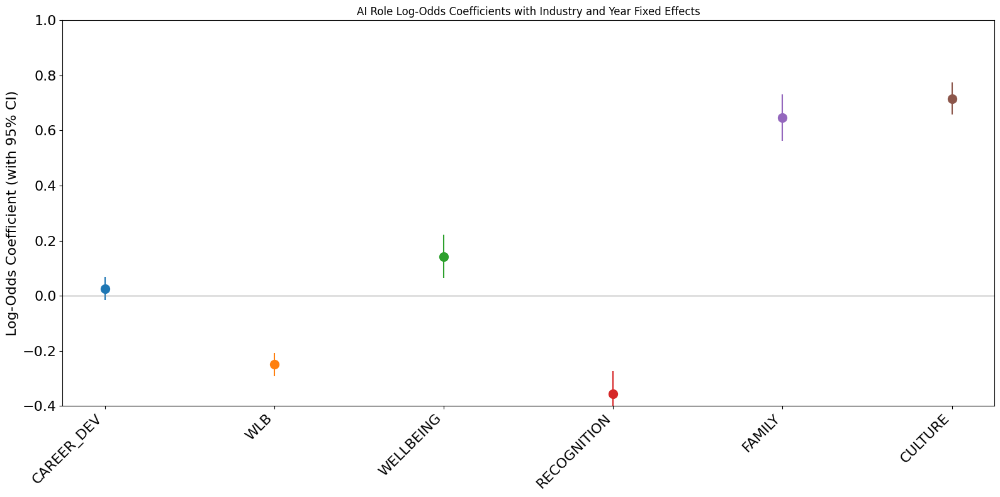

In [98]:
fig, ax = plt.subplots(figsize=(16, 8))
# Define colors for the 9 AI skills categories
# colors = ['#E69F00', '#56B4E9', '#009E73', '#CC79A7', '#F0E442', '#0072B2', '#D55E00', '#CC79A7', '#999999']
cmap = plt.get_cmap("tab10")
colors = [cmap(i) for i in range(len(results_df))]
# Plot each AI skill category
for i, row in results_df_2.iterrows():
    ax.errorbar(
        i, row['Coefficient'], 
        yerr=row['Error'], 
        fmt='o', color=colors[i], label=row['Label'], markersize = 10
    )

# Customize plot
ax.set_xticks(range(len(results_df)))
ax.set_xticklabels(results_df['Label'], rotation=45, ha='right', fontsize = 16)
# ax.set_title('Coefficients for 9 AI Skills Categories')
# ax.set_xlabel('AI Skills Categories', fontsize = 18)
ax.set_ylabel('Log-Odds Coefficient (with 95% CI)', fontsize = 16)
ax.axhline(0, color='grey', linewidth=0.8)
# ax.axhline(average_coefficient, color='grey', linestyle='--', linewidth=1, label='Average Coefficient')

# Increase the size of y-ticks
ax.tick_params(axis='y', labelsize=16)
ax.set_title('AI Role Log-Odds Coefficients with Industry and Year Fixed Effects')
ax.set_ylim(-0.4, 1.0)
# Add legend
# ax.legend(title='AI Skills', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize = 16, title_fontsize = 16)

plt.tight_layout() 
plt.show()